In [1]:
import matplotlib.colors as mcolors
import matplotlib.animation as ma
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from itertools import product
from scipy import stats
import pandas as pd
import numpy as np
import numba as nb
import imageio
import os
import shutil

randomSeed = 100

%matplotlib inline
%config InlineBackend.figure_format = "retina"

new_cmap = mcolors.LinearSegmentedColormap.from_list(
    "new", plt.cm.jet(np.linspace(0, 1, 256)) * 0.85, N=256
)

@nb.njit
def colors_idx(phaseTheta):
    return np.floor(256 - phaseTheta / (2 * np.pi) * 256).astype(np.int32)

import seaborn as sns

sns.set_theme(
    style="ticks", 
    font_scale=1.1, rc={
    'figure.figsize': (6, 5),
    'axes.facecolor': 'white',
    'figure.facecolor': 'white',
    'grid.color': '#dddddd',
    'grid.linewidth': 0.5,
    "lines.linewidth": 1.5,
    'text.color': '#000000',
    'figure.titleweight': "bold",
    'xtick.color': '#000000',
    'ytick.color': '#000000'
})

plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'
#plt.rcParams['animation.ffmpeg_path'] = "/opt/conda/bin/ffmpeg"

from main import *
from multiprocessing import Pool
import pandas as pd

# colors = ["#403990", "#80A6E2", "#FBDD85", "#F46F43", "#CF3D3E"]
# cmap = mcolors.LinearSegmentedColormap.from_list("my_colormap", colors)

colors = ["#403990", "#3A76D6", "#FFC001", "#F46F43", "#FF0000"]
cmap = mcolors.LinearSegmentedColormap.from_list("my_colormap", colors)
cmap_r = mcolors.LinearSegmentedColormap.from_list("my_colormap", colors[::-1])

SAVE_PATH = "/home/thanmark/MS_DATA/cryst"
MP4_PATH = "/home/thanmark/mp4"

In [42]:
phaseLags = [0.6 * np.pi]
omegaMins = [0]  # np.linspace(1e-5, 3, 21)
randomSeed = 10
strengthKs = np.linspace(5, 20, 7)  # [20]  # np.linspace(1, 20, 7)
distanceD0s = np.linspace(0.3, 1.1, 7)  #  np.linspace(0.1, 3, 7)  # [1]
deltaOmegas = [0]  # np.linspace(1e-5, 3, 21)  # [1.0]

models = [
    PhaseLagPatternFormation(
        strengthK=strengthK, distanceD0=distanceD0, phaseLagA0=phaseLag,
        freqDist="cauchy", initPhaseTheta=None,
        omegaMin=omegaMin, deltaOmega=deltaOmega, 
        agentsNum=2000, dt=0.005,
        tqdm=True, savePath=SAVE_PATH, shotsnaps=10, 
        randomSeed=randomSeed, overWrite=False
    )
    for strengthK in strengthKs
    for distanceD0 in distanceD0s
    for omegaMin in omegaMins
    for deltaOmega in deltaOmegas
    for phaseLag in phaseLags
]

In [2]:
phaseLags = [0.6 * np.pi]
omegaMins = [0]  # np.linspace(1e-5, 3, 21)
randomSeed = 10
strengthKs = np.linspace(1, 20, 7)  # [20]  # np.linspace(1, 20, 7)
distanceD0s = np.linspace(0.1, 3, 7)  #  np.linspace(0.1, 3, 7)  # [1]
deltaOmegas = [1]  # np.linspace(1e-5, 3, 21)  # [1.0]

models = [
    PhaseLagPatternFormation(
        strengthK=strengthK, distanceD0=distanceD0, phaseLagA0=phaseLag,
        freqDist="uniform", initPhaseTheta=None,
        omegaMin=omegaMin, deltaOmega=deltaOmega, 
        agentsNum=3000, dt=0.005,
        tqdm=True, savePath=SAVE_PATH, shotsnaps=10, 
        randomSeed=randomSeed, overWrite=False
    )
    for strengthK in strengthKs
    for distanceD0 in distanceD0s
    for omegaMin in omegaMins
    for deltaOmega in deltaOmegas
    for phaseLag in phaseLags
]

In [ ]:
sas = list()
for model in tqdm(models):
    try:
        sa = StateAnalysis(model)
    except:
        sa = None
    sas.append(sa)

In [3]:
savePath = (
    f"last_state/{models[0].__class__.__name__}_"
    f"{models[0].freqDist}_"
    "lastState.h5"
)
modelsNum = len(models)

sas = list()
allPositionX = pd.read_hdf(savePath, key="positionX")
allPhaseTheta = pd.read_hdf(savePath, key="phaseTheta")
allPositionX = allPositionX.values.reshape(modelsNum, models[0].agentsNum, 2)
allPhaseTheta = allPhaseTheta.values.reshape(modelsNum, models[0].agentsNum)

for i, model in enumerate(models):
    sa = StateAnalysis()
    sa.model = model
    sa.totalPositionX = np.array([allPositionX[i]])
    sa.totalPhaseTheta = np.array([allPhaseTheta[i]])
    sas.append(sa)

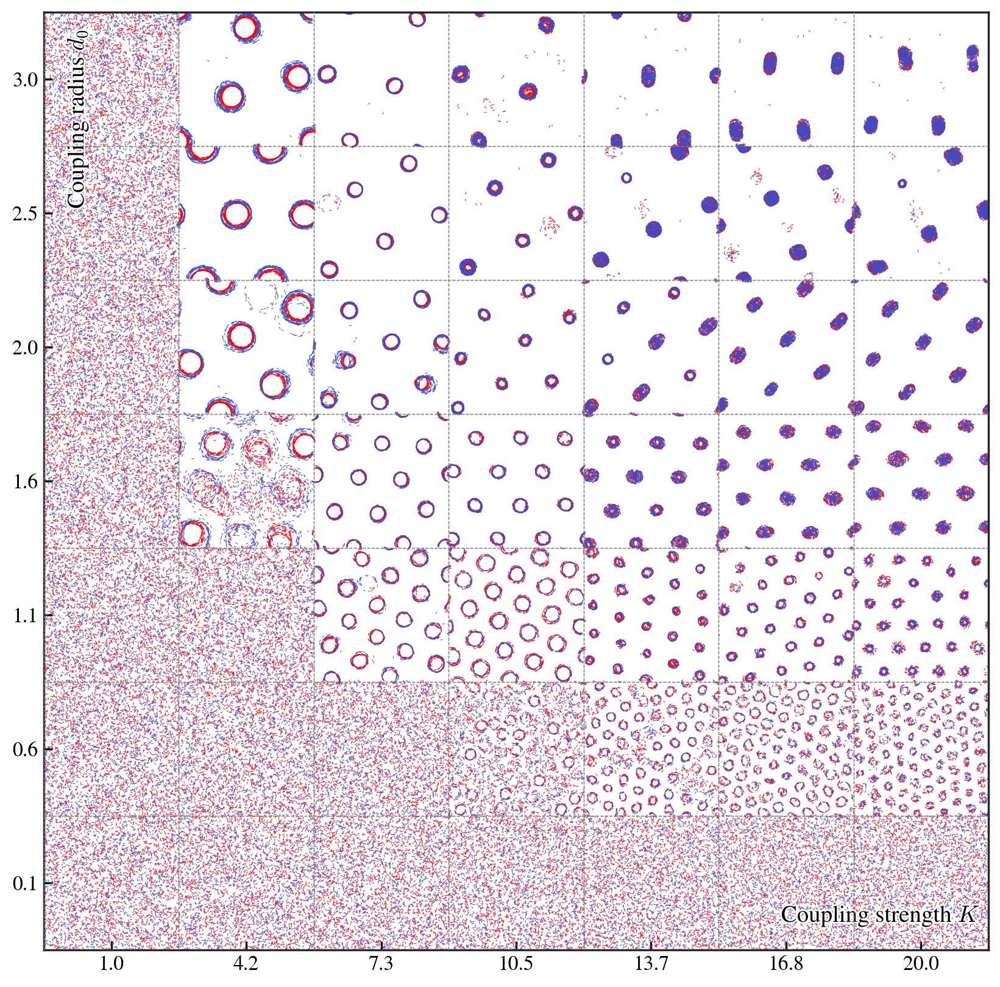

In [18]:
from matplotlib.patheffects import withStroke

colParams = distanceD0s
rowParams = strengthKs
colorsBy = "freq"

# fig, ax = plt.subplots(figsize=(len(rowParams) * 4, len(colParams) * 4))
fig, ax = plt.subplots(figsize=(10, 10))

for i, sa in enumerate(sas):
    if sa is None:
        continue
    row = i // len(rowParams)
    col = i % len(rowParams)
    
    positionShift = np.array([row, col]) * sa.model.boundaryLength
    positionX, phaseTheta = sa.get_state(-1)
    positionX = positionX + positionShift
    if colorsBy == "freq":
        colors = (
            ["red"] * (sa.model.freqOmega >= 0).sum() + 
            ["#414CC7"] * (sa.model.freqOmega < 0).sum()
        )
    elif colorsBy == "phase":
        colors = [cmap(i) for i in
            np.floor(256 - phaseTheta / (2 * np.pi) * 256).astype(np.int32)
        ]

    ax.quiver(
        positionX[:, 0], positionX[:, 1],
        np.cos(phaseTheta), np.sin(phaseTheta), 
        color=colors,
        scale=300, width=0.0004
    )
    ax.axhline(
        y=col * sa.model.boundaryLength, 
        color="gray", linewidth=0.5, linestyle="--", alpha=0.3, zorder=100
    )
    ax.axvline(
        x=row * sa.model.boundaryLength, 
        color="gray", linewidth=0.5, linestyle="--", alpha=0.3, zorder=100
    )

boundaryLength = models[0].boundaryLength
plt.xlim(0, len(rowParams) * boundaryLength)
plt.ylim(0, len(colParams) * boundaryLength)
plt.xticks(
    np.arange(0, len(rowParams) * boundaryLength, boundaryLength) + boundaryLength / 2,
    [f"{k:.1f}" for k in rowParams]
)
plt.yticks(
    np.arange(0, len(colParams) * boundaryLength, boundaryLength) + boundaryLength / 2,
    [f"{d:.1f}" for d in colParams]
)

text1 = plt.text((len(rowParams) - 0.8) * boundaryLength, 0.25 * boundaryLength,
                 "Coupling strength $K$", # weight="bold",
                 fontsize=14, ha="center", va="center")
text2 = plt.text(0.25 * boundaryLength, (len(colParams) - 0.8) * boundaryLength,
                 "Coupling radius $d_0$", # weight="bold",
                 fontsize=14, ha="center", va="center", rotation=90)
for text in [text1, text2]:
    text.set_path_effects([withStroke(linewidth=2, foreground='white')])
plt.tick_params(length=5, direction="in")
# plt.savefig(
#     f"figs/{sa.model.__class__.__name__}_"
#     f"varying_strengthK_and_distanceD0_{colorsBy}_"
#     f"a{phaseLags[0]:.2f}_Do{deltaOmegas[0]}"
#     f"{'initPhaseTheta,' if sa.model.initPhaseTheta is not None else ''}"
#     f"_aN{sa.model.agentsNum}_dist{sa.model.freqDist}.pdf", 
#     bbox_inches="tight"
# )

In [31]:
def calc_lattice_constants(sa: StateAnalysis, plot: bool = False):

    sa: StateAnalysis
    model = sa.model
    shift = np.array([0., 0.])
    analysisRadius = model.speedV / np.abs(model.strengthK * np.sin(model.phaseLagA0))

    classes, centers = sa.calc_classes_and_centers(classDistance=analysisRadius, lookIdx=-1)
    if len(classes) > model.agentsNum * 0.2:
        print(f"Too many classes: {len(classes)} > {model.agentsNum * 0.2}, skipping.")
        return [], []
    numInClasses = np.array([len(c) for c in classes])
    # zScoreNum = stats.zscore(numInClasses)
    # classes = [classes[c] for c in range(len(classes)) 
    #            if (zScoreNum[c] > -0.4) and (numInClasses[c] > 10)]
    numThres = np.median(numInClasses[numInClasses > 10]) * 0.3
    classes = [classes[c] for c in range(len(classes))
               if (numInClasses[c] > max(numThres, 10))]
    centers = np.mod(centers + shift, model.boundaryLength)
    if len(classes) <= 1:
        print("Not enough classes, skipping.")
        return [], []

    classCenters: List[np.ndarray] = []
    for c in classes:
        singleClassCenters = centers[c]

        maxDeltaX = np.abs(singleClassCenters[:, 0] - singleClassCenters[:, 0, np.newaxis]).max()
        subXShift = model.halfBoundaryLength if maxDeltaX > model.halfBoundaryLength else 0
        maxDeltaY = np.abs(singleClassCenters[:, 1] - singleClassCenters[:, 1, np.newaxis]).max()
        subYShift = model.halfBoundaryLength if maxDeltaY > model.halfBoundaryLength else 0

        singleClassCenters = np.mod(singleClassCenters - np.array([subXShift, subYShift]), model.boundaryLength)
        classCenter = np.mod(singleClassCenters.mean(axis=0) + np.array([subXShift, subYShift]), model.boundaryLength)
        classCenters.append(classCenter)
    classCenters: np.ndarray = np.array(classCenters)

    edgeLenThres = (
        model.distanceD0 + 2 * analysisRadius
    ) * 1.3
    medianRate = np.inf  # 1.2
    # print(edgeLenThres)
    edges = sa.calc_nearby_edges(classCenters=classCenters, 
                                 edgeLenThres=edgeLenThres, 
                                 medianRate=medianRate,
                                 relativeDistance=True)
    if len(edges) == 0:
        print("No edges found, skipping.")
        return [], []

    classAnalRadius = list()

    for _, oscIdx in enumerate(classes):
        freqOmega: np.ndarray = sa.model.freqOmega[oscIdx]
        meanFreq = freqOmega.mean()
        analRadius = model.speedV / np.abs(meanFreq - model.strengthK * np.sin(model.phaseLagA0))
        
        classAnalRadius.append(analRadius)

    classAnalRadius = np.array(classAnalRadius)
    edgeDistances = np.array([
        sa.calc_replative_distance(classCenters[edge[0]], classCenters[edge[1]]) 
        for edge in edges
    ])

    if plot:
        sa.plot_spatial(colorsBy="freq", index=-1, shift=shift)
        plt.scatter(
            classCenters[:, 0], classCenters[:, 1],
            facecolor="white", s=30, edgecolor="black", lw=1.5
        )
        edges, ajdClassCenters = sa.calc_nearby_edges(
            classCenters=classCenters, 
            edgeLenThres=edgeLenThres,
            medianRate=medianRate
        )
        for edge in edges:
            plt.plot(ajdClassCenters[edge, 0], ajdClassCenters[edge, 1],
                    color="black", lw=1.2, alpha=0.3, linestyle=(0, (10, 2)), zorder=0)

    return classAnalRadius, edgeDistances

  0%|          | 0/49 [00:00<?, ?it/s]

Not enough classes, skipping.
Not enough classes, skipping.
Not enough classes, skipping.
Not enough classes, skipping.
Not enough classes, skipping.
Not enough classes, skipping.
Not enough classes, skipping.
Not enough classes, skipping.
Not enough classes, skipping.
Not enough classes, skipping.


d:\anaconda3\envs\py37\lib\site-packages\numpy\core\fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
d:\anaconda3\envs\py37\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


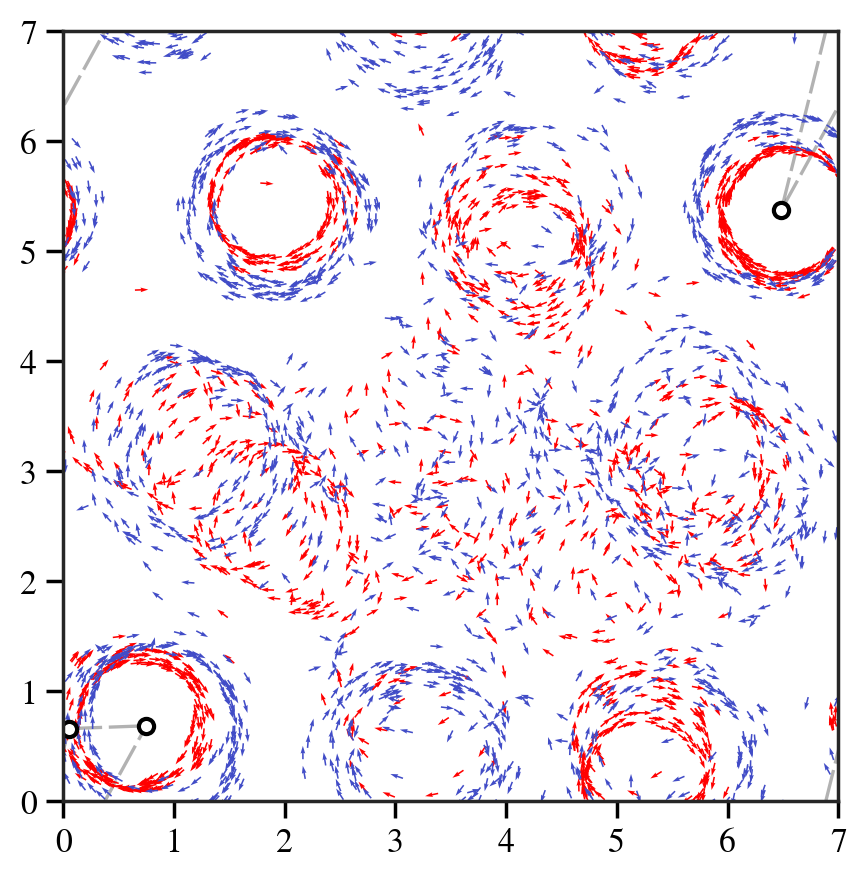

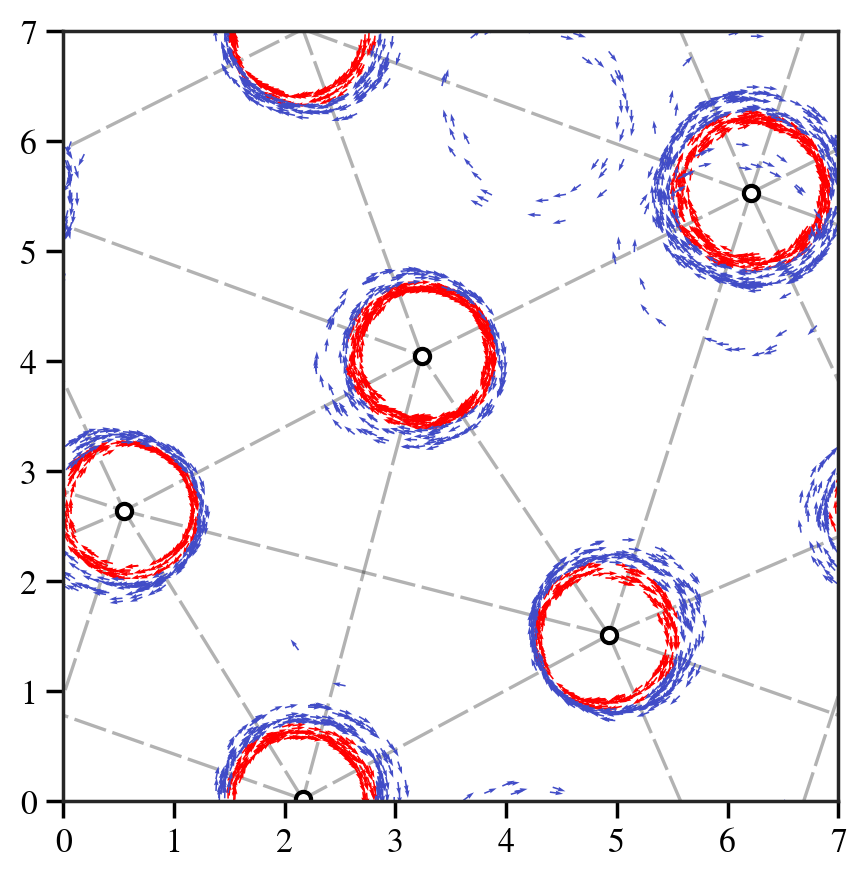

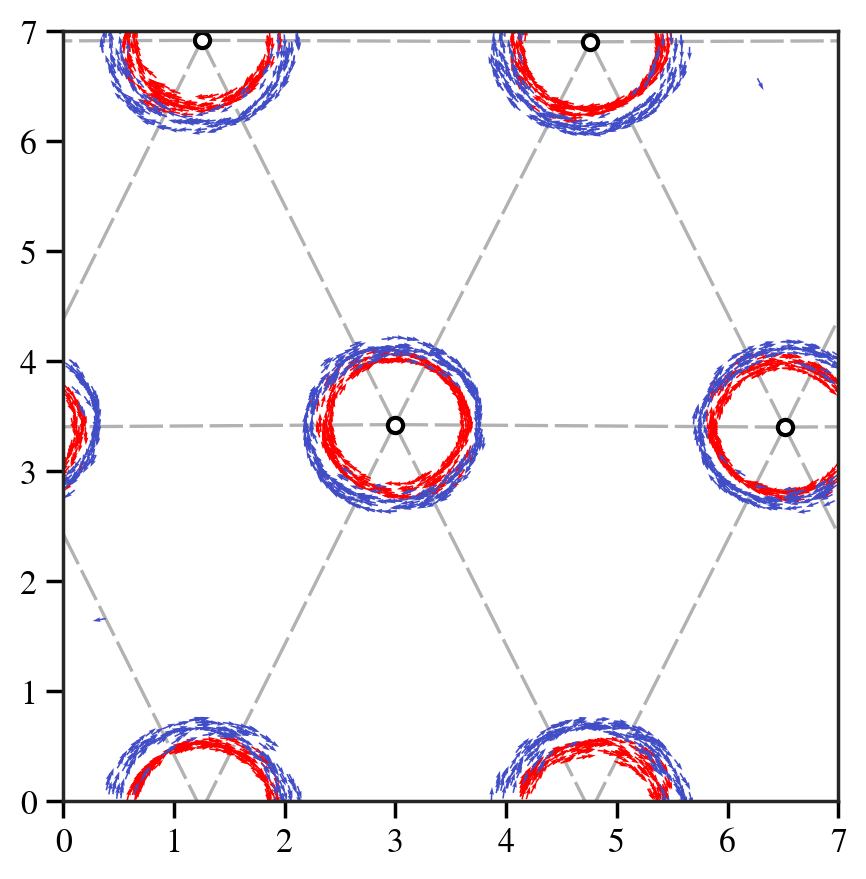

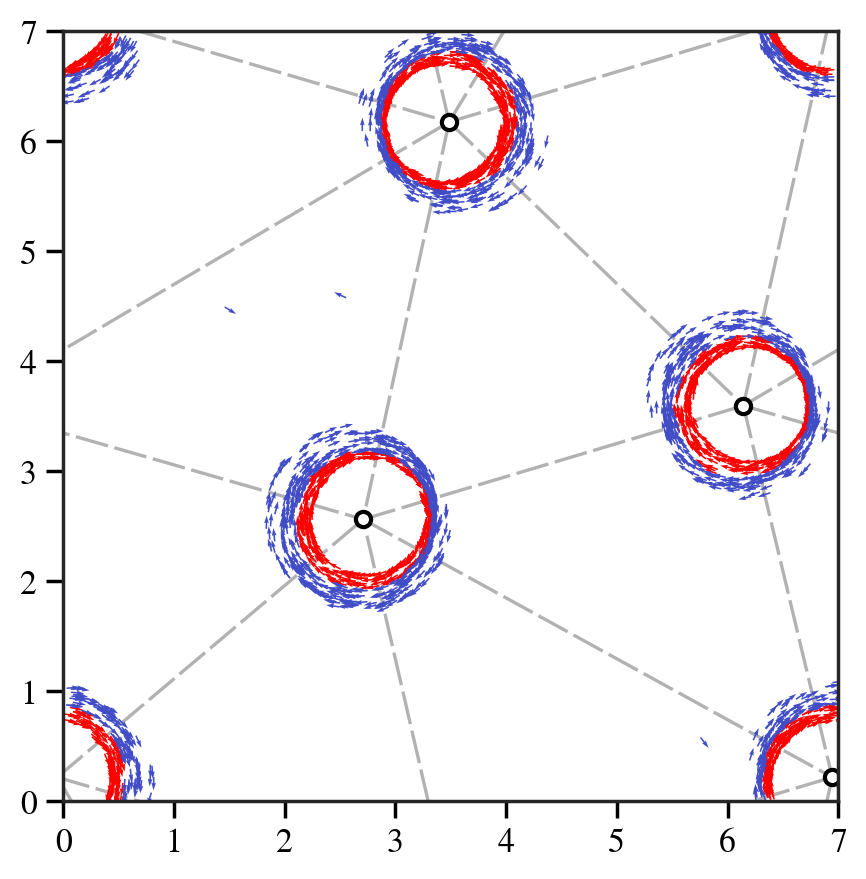

Not enough classes, skipping.
Not enough classes, skipping.


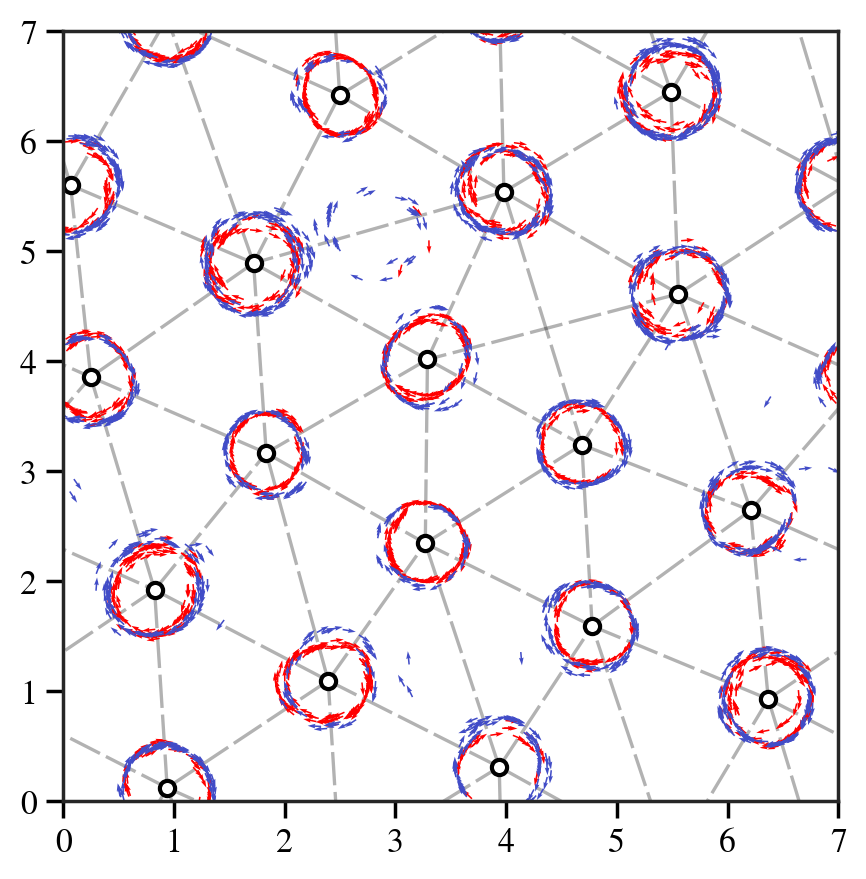

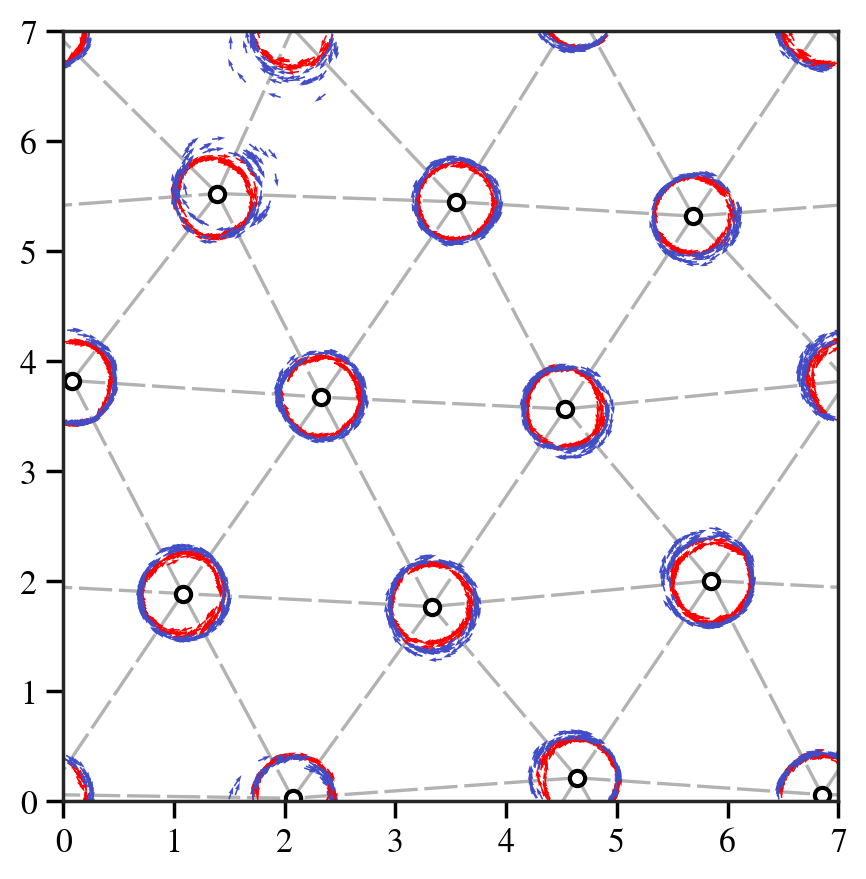

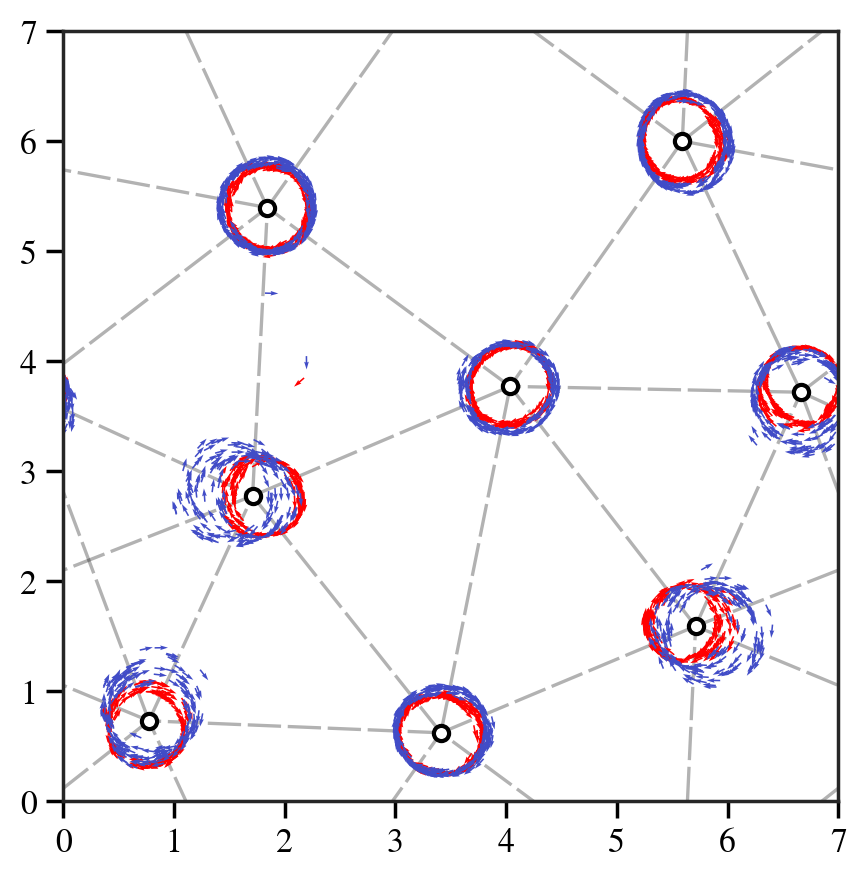

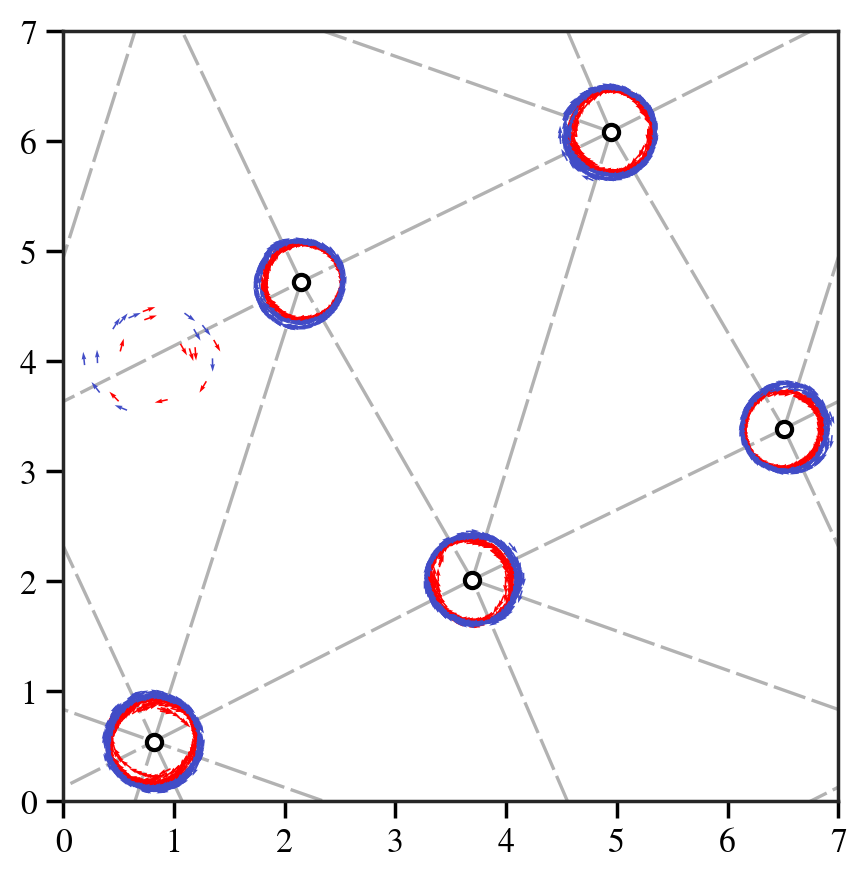

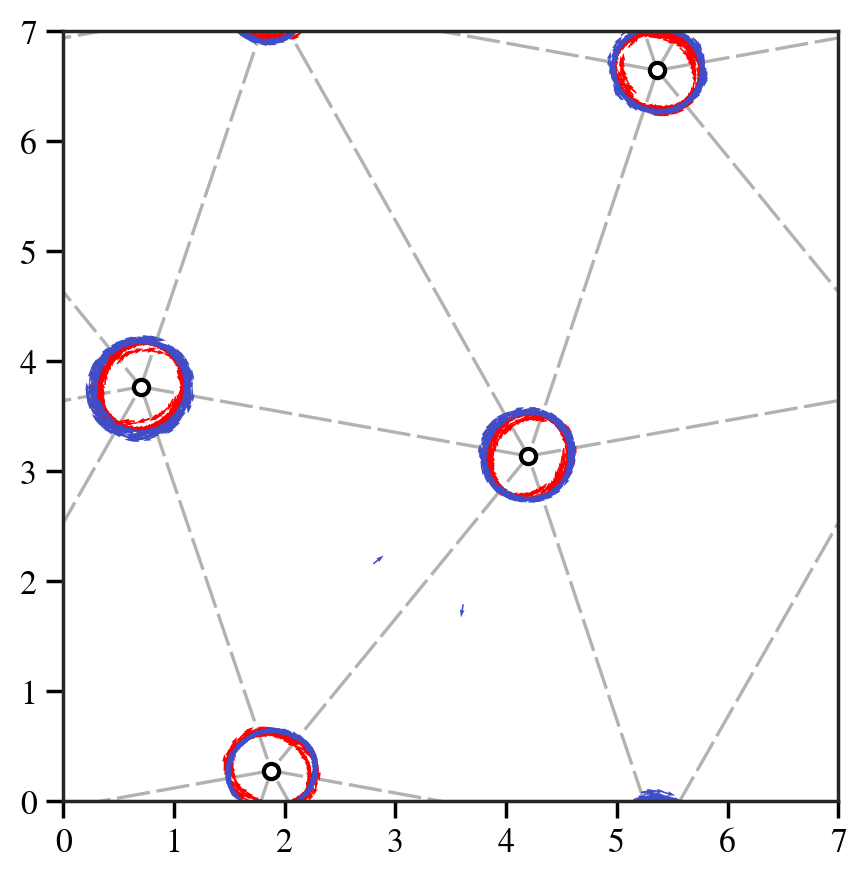

Not enough classes, skipping.


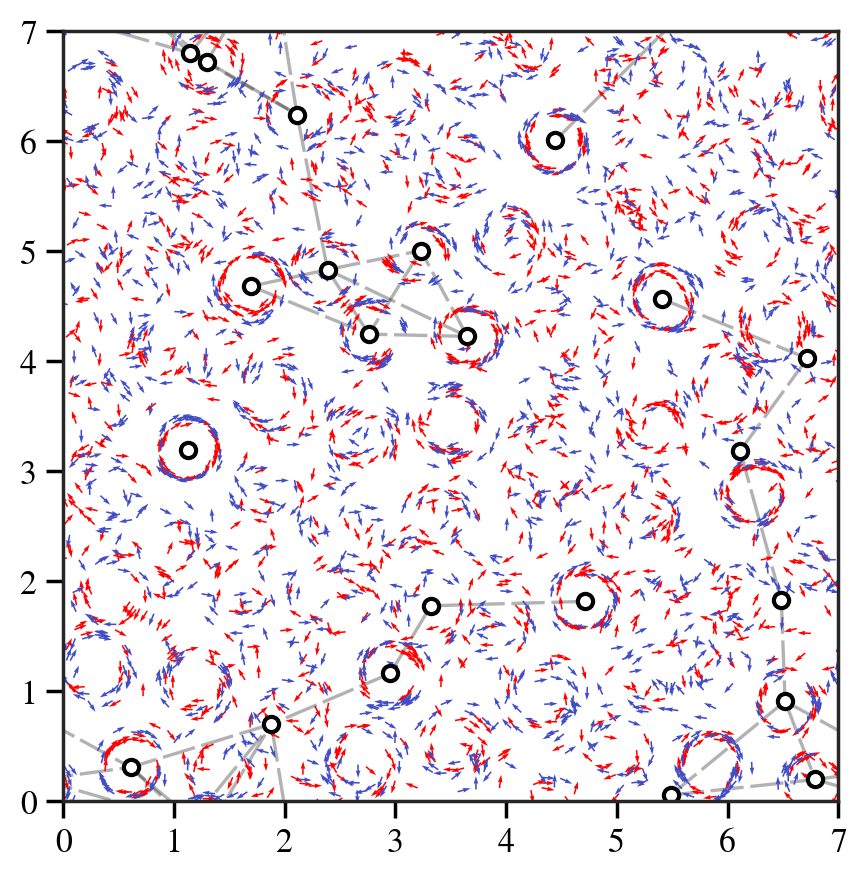

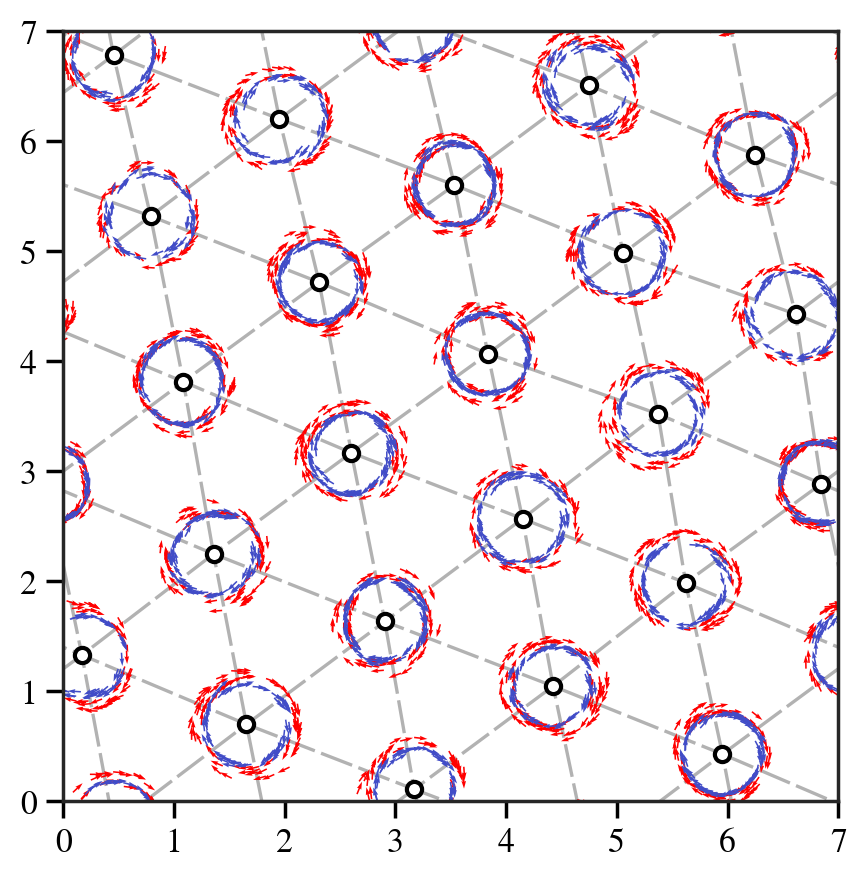

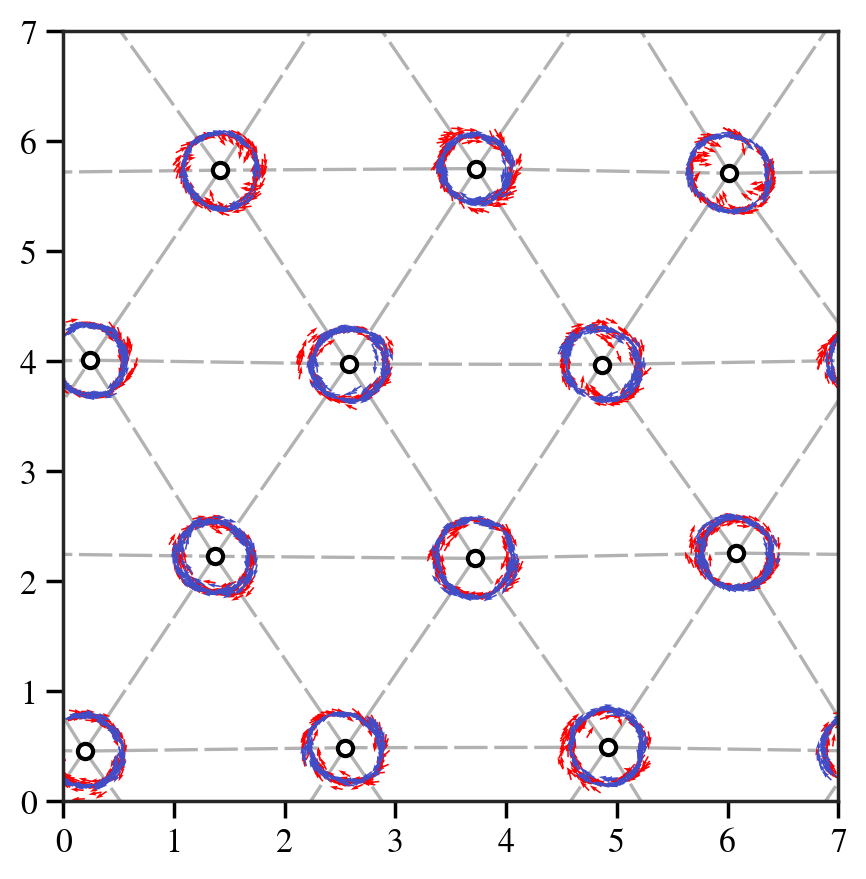

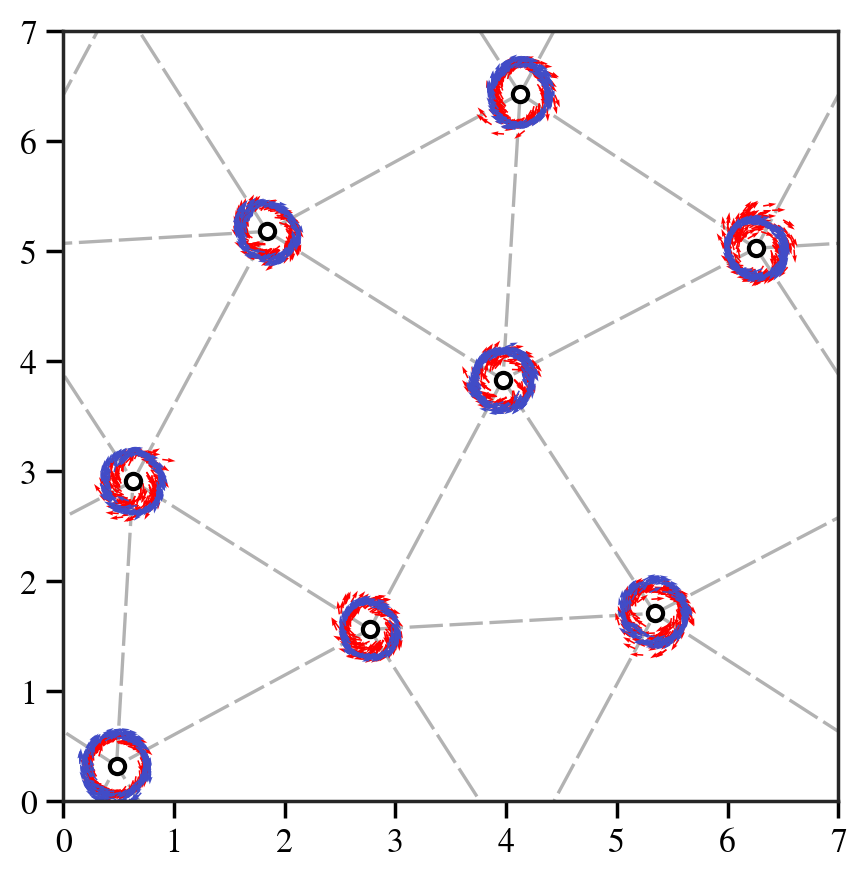

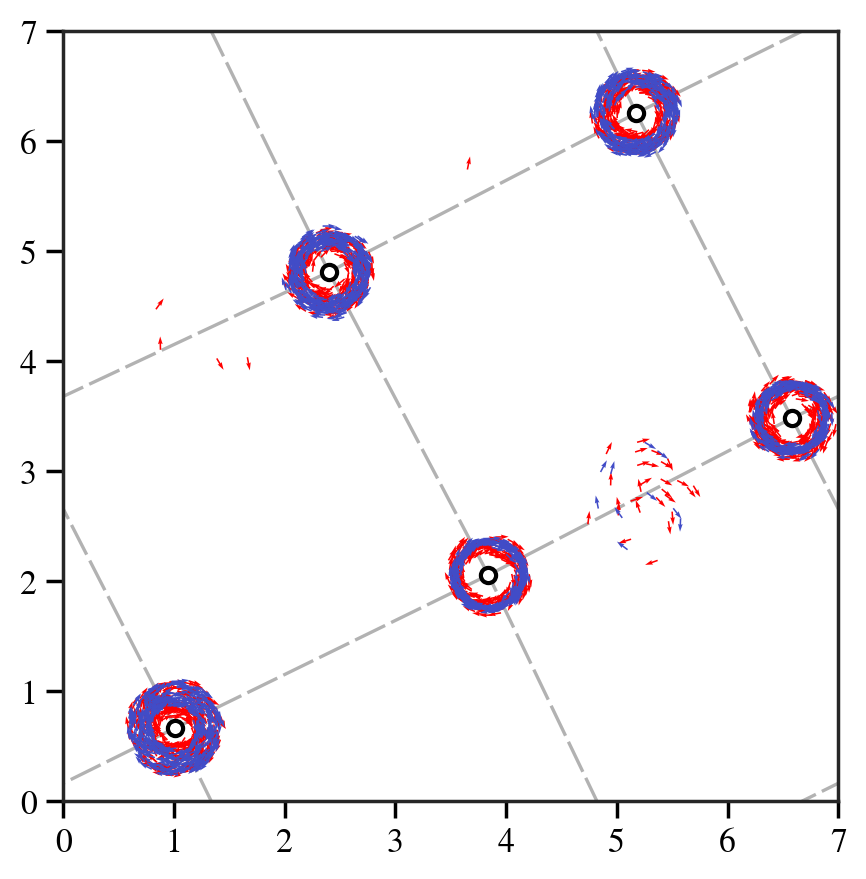

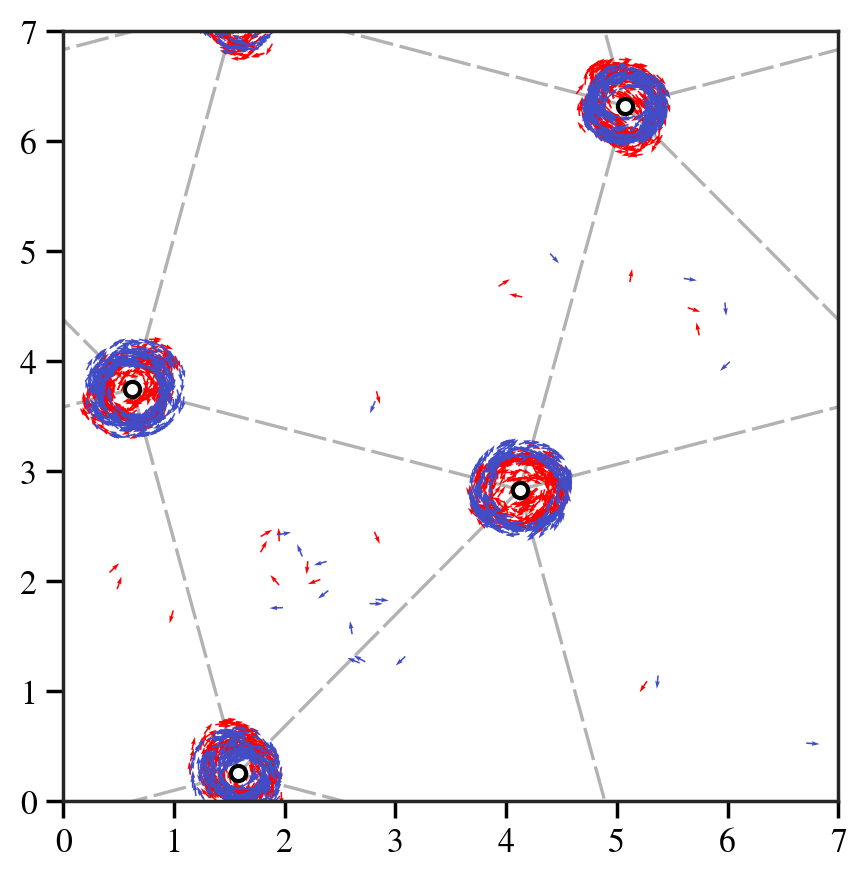

No edges found, skipping.


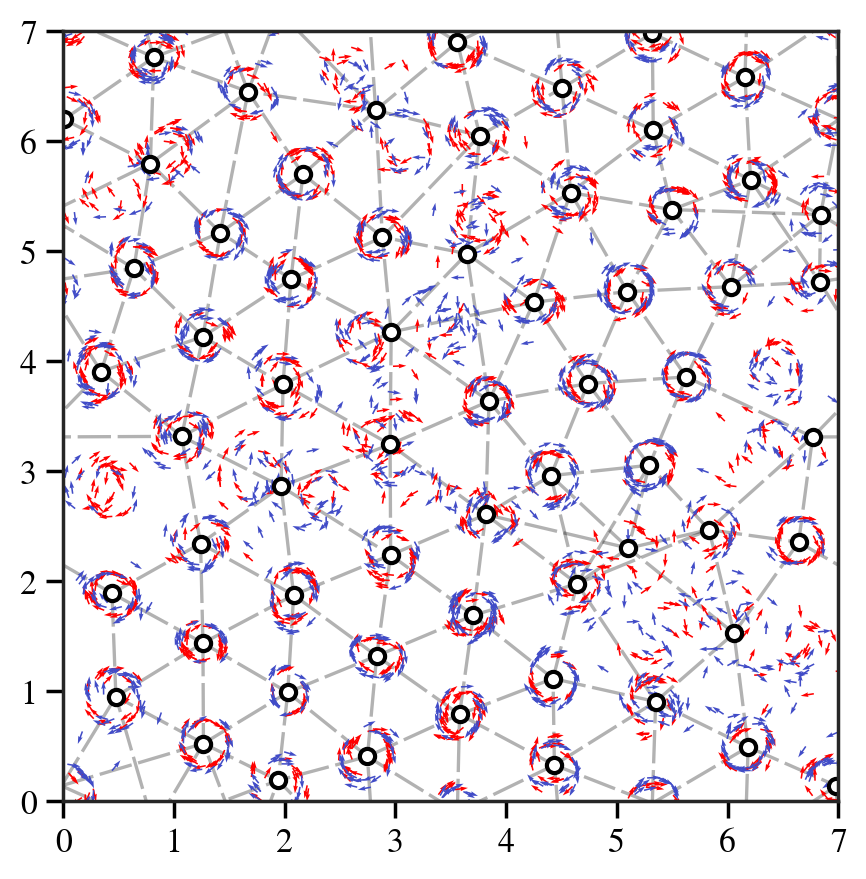

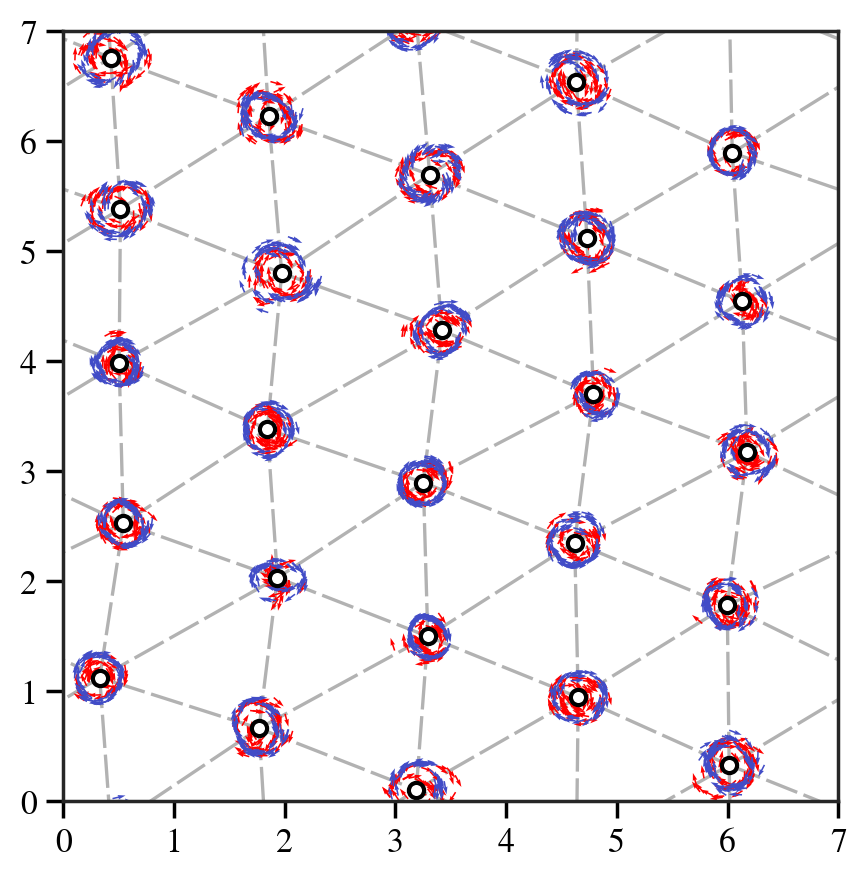

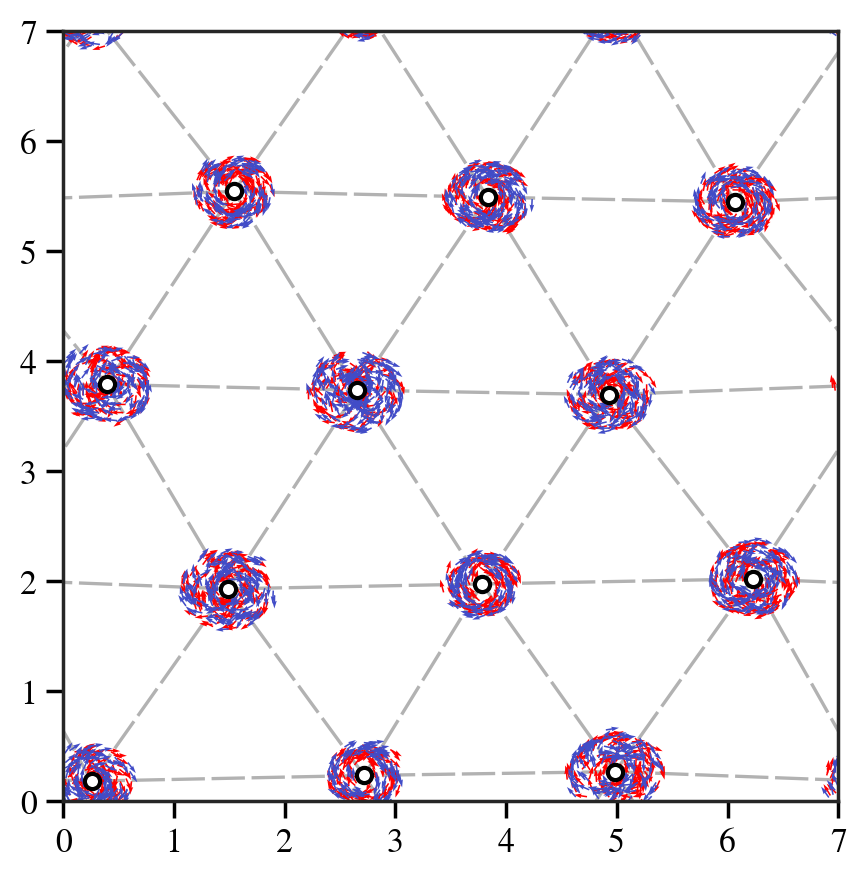

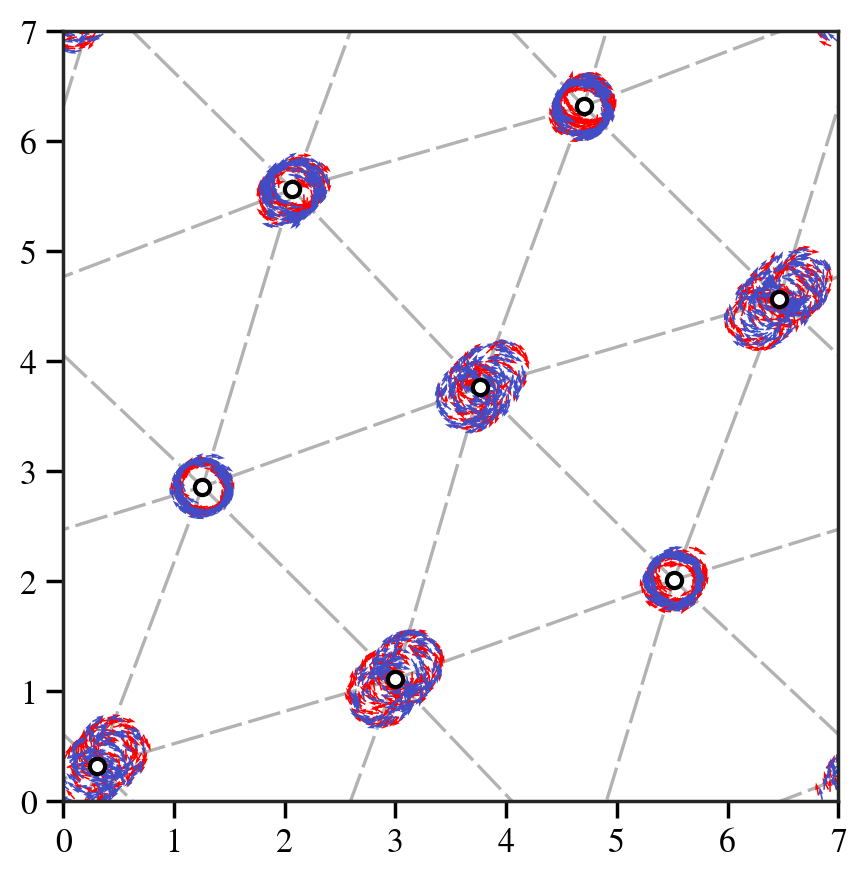

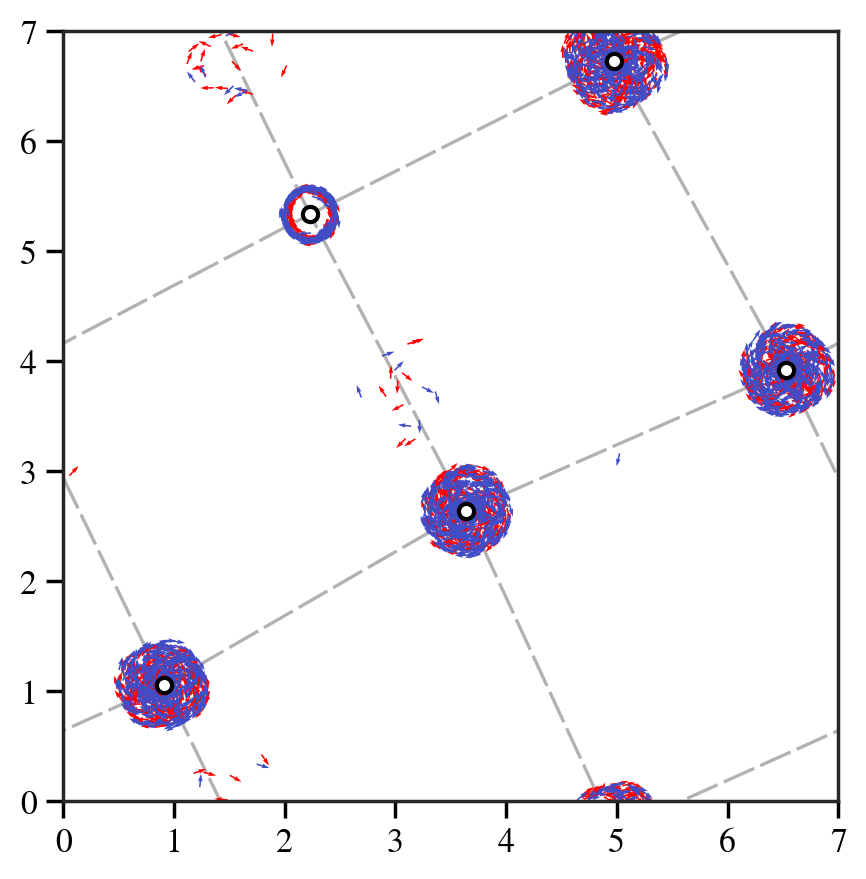

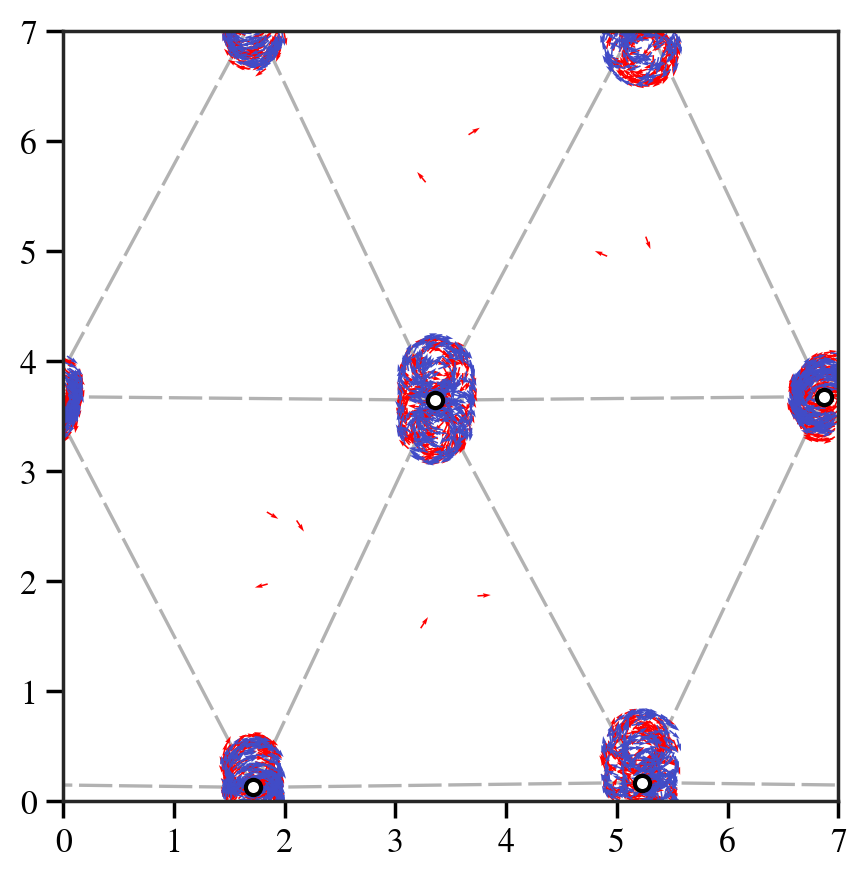

No edges found, skipping.


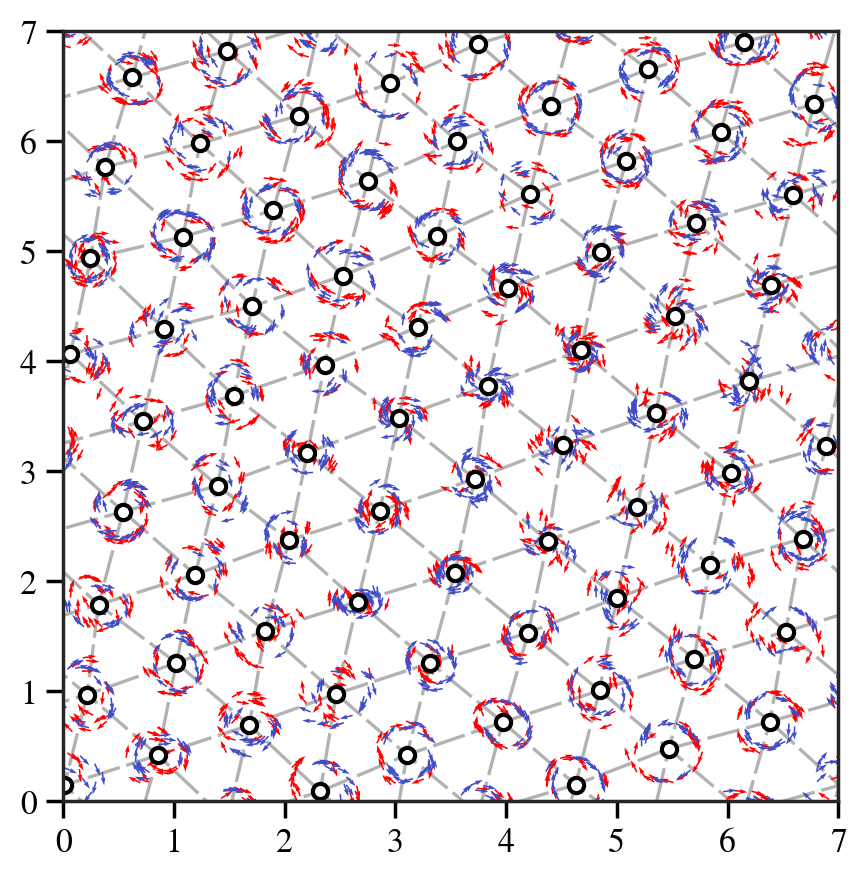

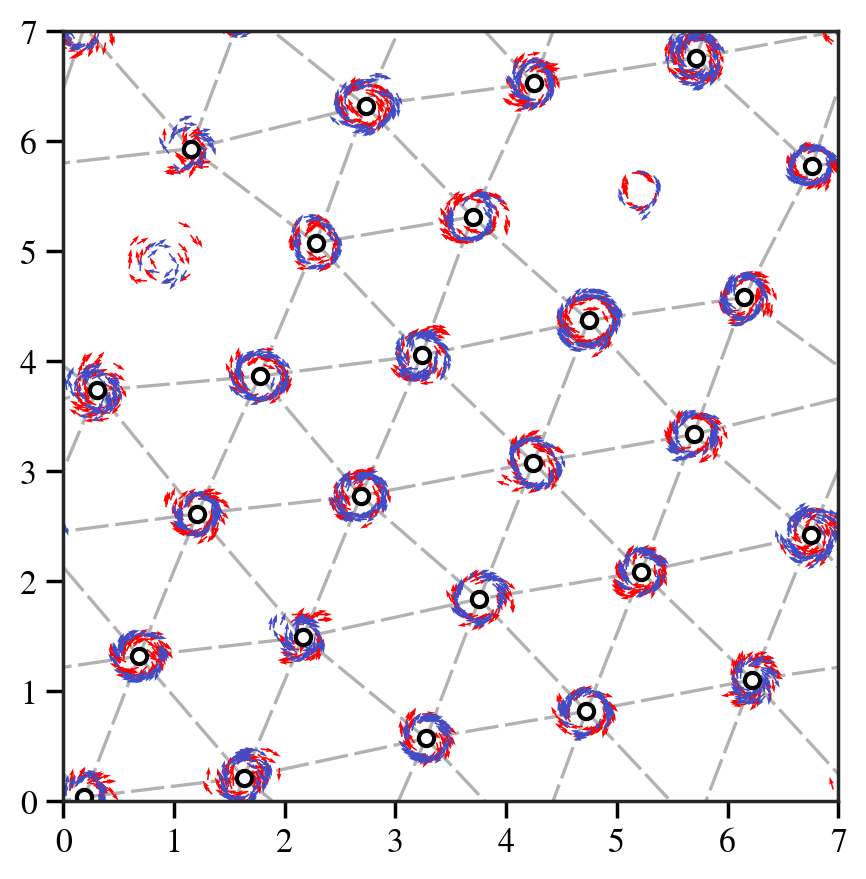

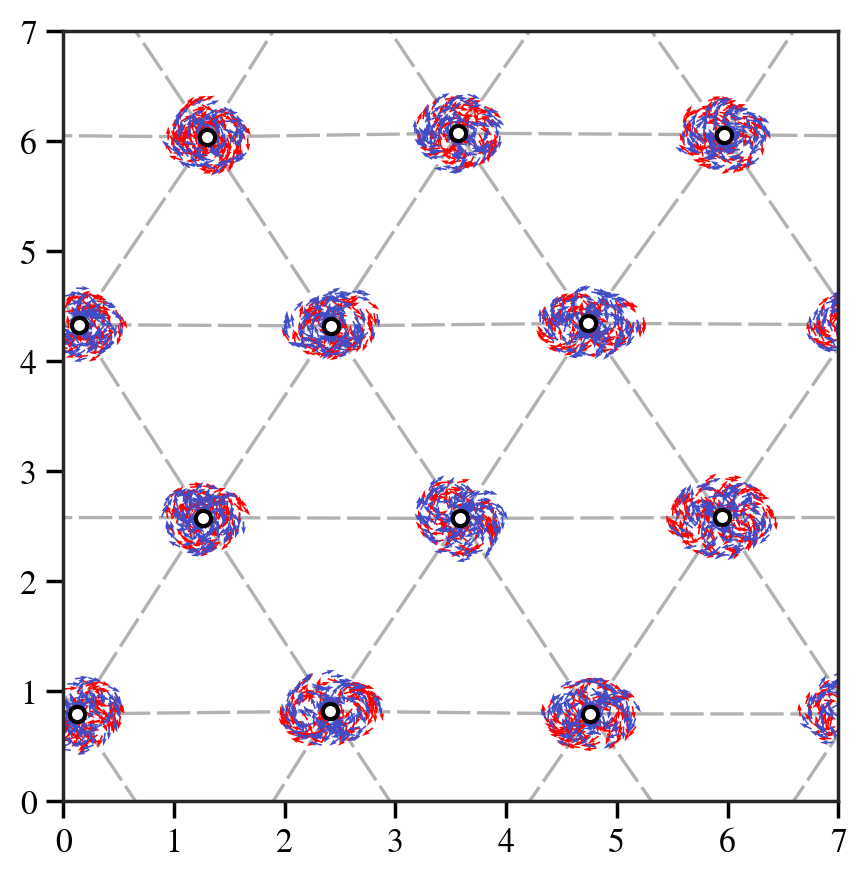

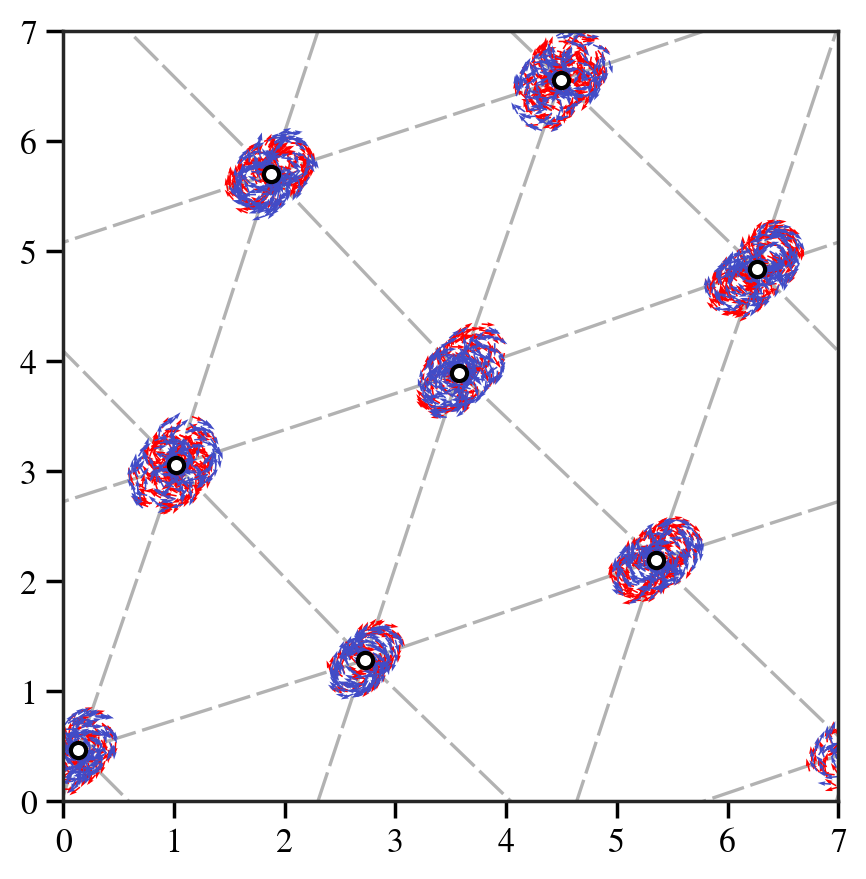

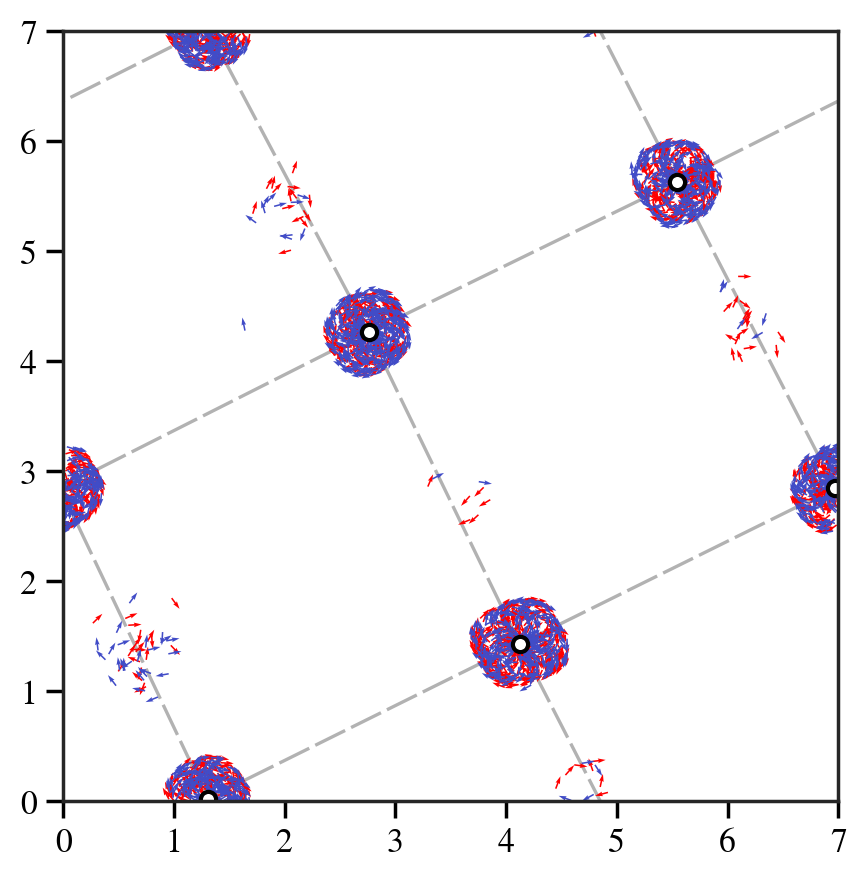

...

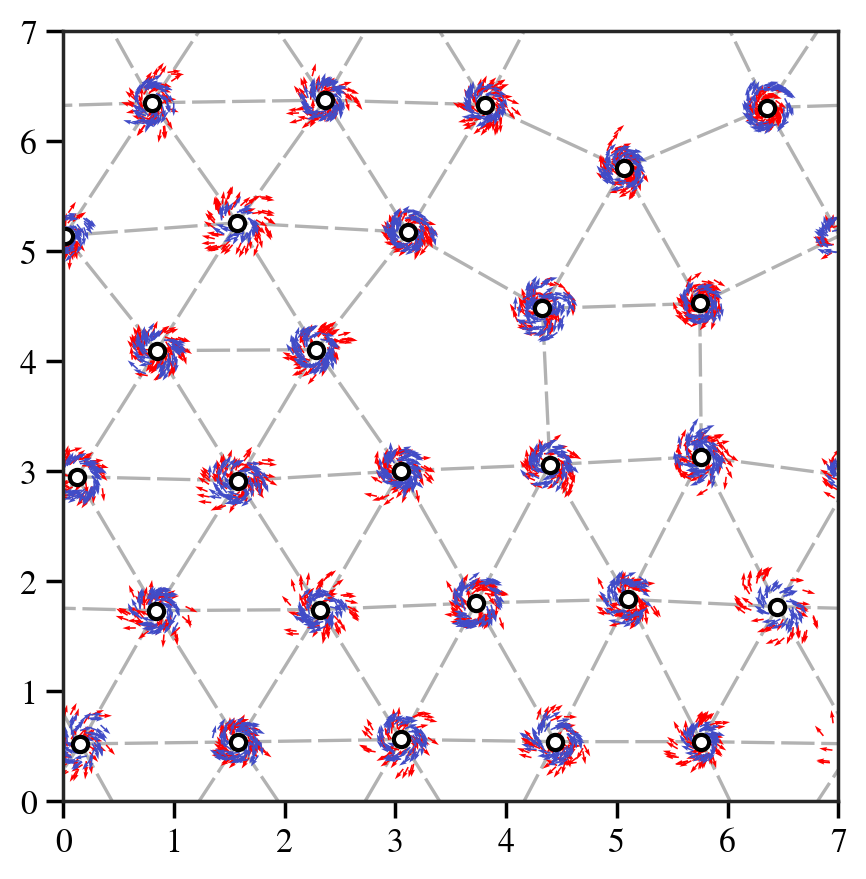

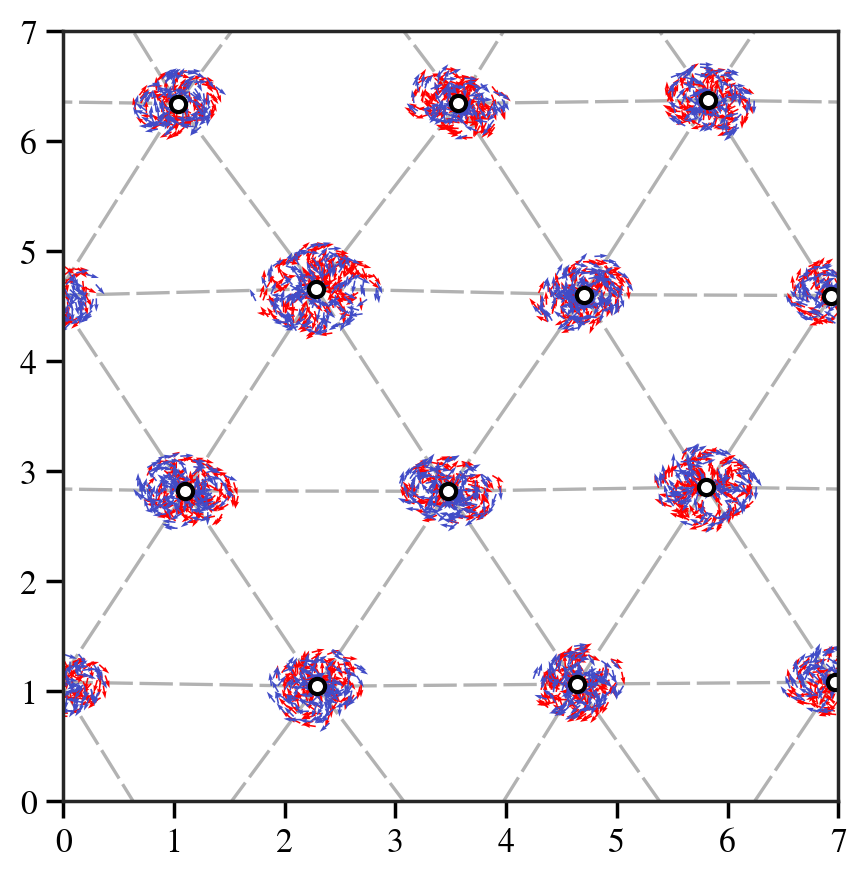

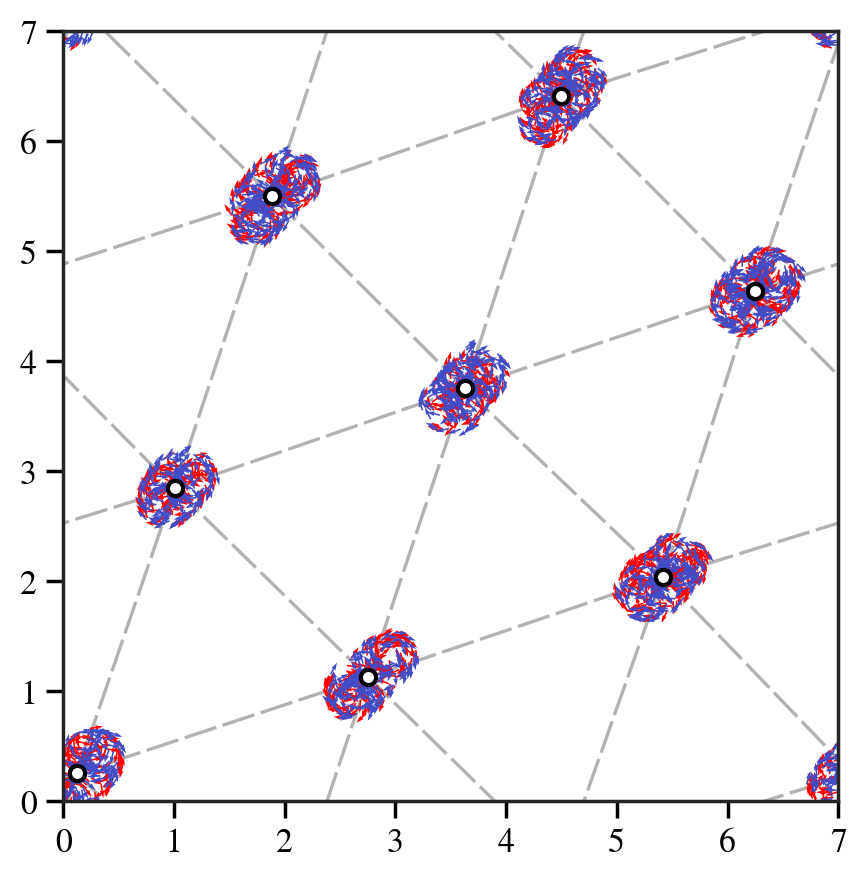

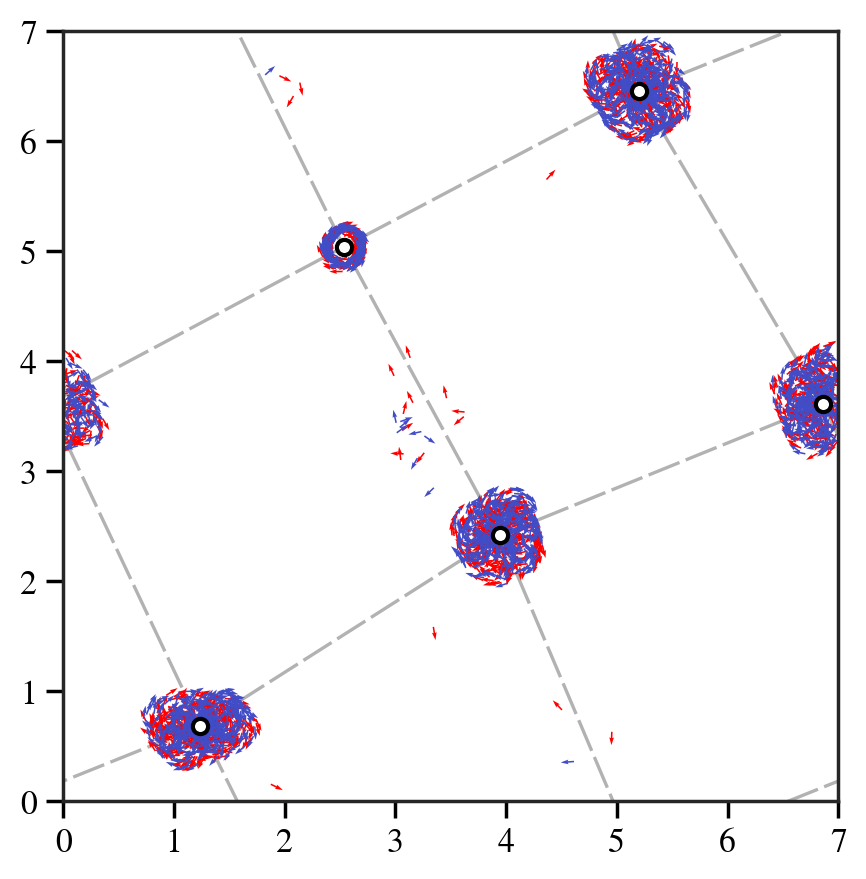

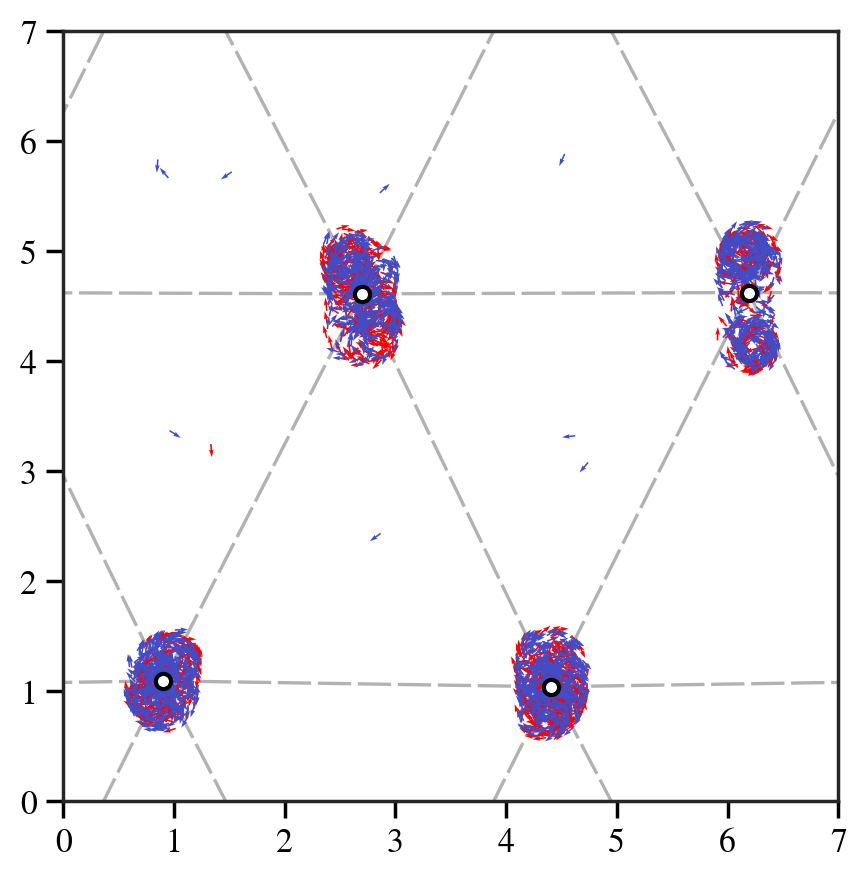

In [32]:
from multiprocessing import Pool

selectedSas = sas

# with Pool(len(selectedSas)) as pool:
#     results = pool.map(
#         calc_lattice_constants, 
#         tqdm(selectedSas, total=len(selectedSas))
#     )

results = list()
for sa in tqdm(selectedSas, total=len(selectedSas)):
    results.append(calc_lattice_constants(sa, plot=True))
    plt.show()

classAnalRadius = dict()
edgeDistances = dict()

for i, (analRadius, edgeDistance) in enumerate(results):
    model: PhaseLagPatternFormation = selectedSas[i].model
    classAnalRadius[(model.strengthK, model.distanceD0)] = analRadius
    edgeDistances[(model.strengthK, model.distanceD0)] = edgeDistance

In [ ]:
distanceD0s[2:-1]

array([0.56666667, 0.7       , 0.83333333, 0.96666667])

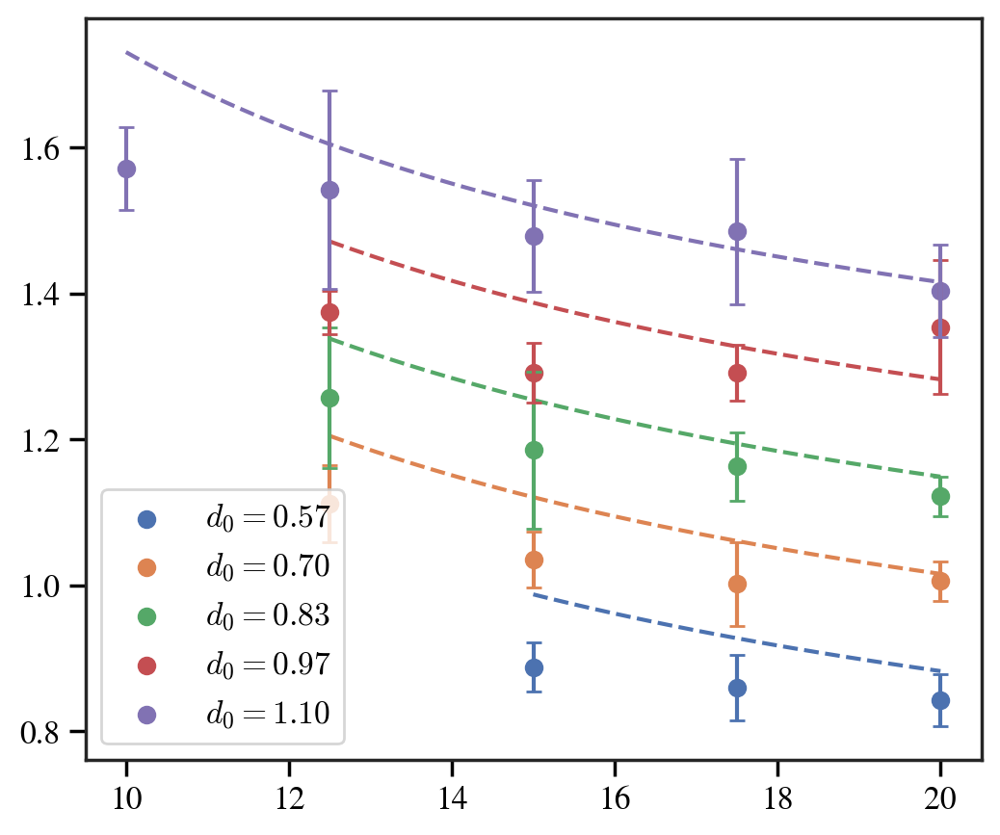

In [ ]:
# selectD0s = distanceD0s[1:]  # 3000 uniform
# selectKsDict = {
#     selectD0s[0]: strengthKs[-2:],
#     selectD0s[1]: strengthKs[2:],
#     selectD0s[2]: strengthKs[2:],
#     selectD0s[3]: strengthKs[1:],
#     selectD0s[4]: strengthKs[1:],
#     selectD0s[5]: strengthKs[1:],
# }
selectD0s = distanceD0s[2:]  # 2000 cauchy
selectKsDict = {
    selectD0s[0]: strengthKs[-3:],
    selectD0s[1]: strengthKs[3:],
    selectD0s[2]: strengthKs[3:],
    selectD0s[3]: strengthKs[3:],
    selectD0s[4]: strengthKs[2:]
}

fig, ax = plt.subplots(figsize=(6, 5))

for i, selectD0 in enumerate(selectD0s):
    meanEdgeDistances = [edgeDistances[(strengthK, selectD0)].mean() for strengthK in selectKsDict[selectD0]]
    stdEdgeDistances = [edgeDistances[(strengthK, selectD0)].std() for strengthK in selectKsDict[selectD0]]
    # analysisDis = [
    #     selectD0 + 2 * model.speedV / np.abs(strengthK * np.sin(model.phaseLagA0))
    #     for strengthK in selectKsDict[selectD0]
    # ]
    linspaceKs = np.linspace(
        selectKsDict[selectD0][0], selectKsDict[selectD0][-1], 100
    )
    analysisDis = selectD0 + 2 * model.speedV / np.abs(linspaceKs * np.sin(model.phaseLagA0))

    plt.plot(linspaceKs, analysisDis, ls="--")
    ax.errorbar(selectKsDict[selectD0], meanEdgeDistances, yerr=stdEdgeDistances,
                color="none", ecolor=f"C{i}", capsize=3, ms=4)
    ax.scatter(selectKsDict[selectD0], meanEdgeDistances, color=f"C{i}", label=f"$d_0={selectD0:.2f}$")

plt.legend()
# plt.ylim(0, 1.5)

In [5]:
# model = [model for model in models 
#       if (model.distanceD0 == distanceD0s[2]) and 
#       (model.strengthK == strengthKs[-3])][0]
# sa = StateAnalysis(model)

sa: StateAnalysis = [sa for sa in sas
      if (sa.model.distanceD0 == distanceD0s[3]) and
      (sa.model.strengthK == strengthKs[-3])][0]
model = sa.model

shift = np.array([0., 0.])
analysisRadius = model.speedV / np.abs(model.strengthK * np.sin(model.phaseLagA0))

classes, centers = sa.calc_classes_and_centers(classDistance=analysisRadius, lookIdx=-1)
if len(classes) > model.agentsNum * 0.2:
    print(f"Too many classes: {len(classes)} > {model.agentsNum * 0.2}, skipping.")
    # return [], [], []
numInClasses = [len(c) for c in classes]
zScoreNum = stats.zscore(numInClasses)
classes = [classes[c] for c in range(len(classes)) 
           if (zScoreNum[c] > -np.inf) and (numInClasses[c] > 10)]
centers = np.mod(centers + shift, model.boundaryLength)
if len(classes) <= 1:
    print("Not enough classes, skipping.")
    # return [], [], []

classCenters: List[np.ndarray] = []
for c in classes:
    singleClassCenters = centers[c]

    maxDeltaX = np.abs(singleClassCenters[:, 0] - singleClassCenters[:, 0, np.newaxis]).max()
    subXShift = model.halfBoundaryLength if maxDeltaX > model.halfBoundaryLength else 0
    maxDeltaY = np.abs(singleClassCenters[:, 1] - singleClassCenters[:, 1, np.newaxis]).max()
    subYShift = model.halfBoundaryLength if maxDeltaY > model.halfBoundaryLength else 0

    singleClassCenters = np.mod(singleClassCenters - np.array([subXShift, subYShift]), model.boundaryLength)
    classCenter = np.mod(singleClassCenters.mean(axis=0) + np.array([subXShift, subYShift]), model.boundaryLength)
    classCenters.append(classCenter)
classCenters: np.ndarray = np.array(classCenters)

len(classes)

12

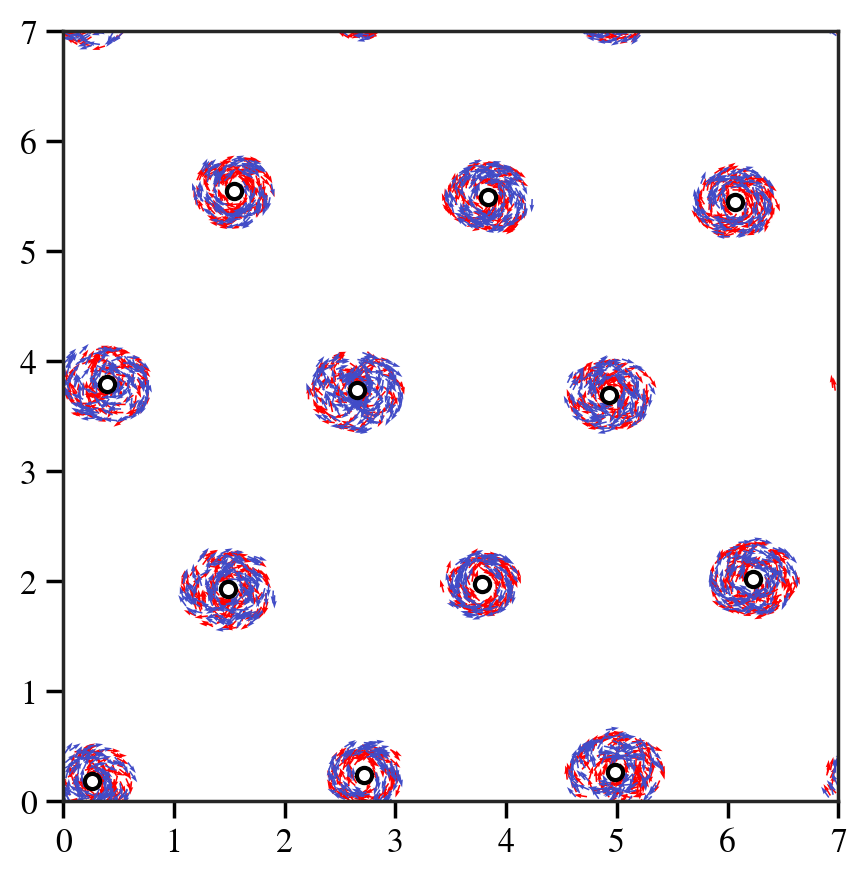

In [6]:
sa.plot_spatial(colorsBy="freq", index=-1, shift=shift)
plt.scatter(
    classCenters[:, 0], classCenters[:, 1],
    facecolor="white", s=30, edgecolor="black", lw=1.5
)

In [13]:
from scipy import stats

shift = np.array([0., 0.])
analysisRadius = model.speedV / np.abs(model.strengthK * np.sin(model.phaseLagA0))

classes, centers = sa.calc_classes_and_centers(classDistance=analysisRadius, lookIdx=-1)
if len(classes) > model.agentsNum * 0.2:
    print(f"Too many classes: {len(classes)} > {model.agentsNum * 0.2}, skipping.")
    # return [], []
numInClasses = [len(c) for c in classes]
# zScoreNum = stats.zscore(numInClasses)
# classes = [classes[c] for c in range(len(classes)) 
#            if (zScoreNum[c] > -0.4) and (numInClasses[c] > 10)]
classes = [classes[c] for c in range(len(classes))
            if (numInClasses[c] > np.median(numInClasses) * 0.3)]
centers = np.mod(centers + shift, model.boundaryLength)
if len(classes) <= 1:
    print("Not enough classes, skipping.")
    # return [], [], []

classCenters: List[np.ndarray] = []
for c in classes:
    singleClassCenters = centers[c]

    maxDeltaX = np.abs(singleClassCenters[:, 0] - singleClassCenters[:, 0, np.newaxis]).max()
    subXShift = model.halfBoundaryLength if maxDeltaX > model.halfBoundaryLength else 0
    maxDeltaY = np.abs(singleClassCenters[:, 1] - singleClassCenters[:, 1, np.newaxis]).max()
    subYShift = model.halfBoundaryLength if maxDeltaY > model.halfBoundaryLength else 0

    singleClassCenters = np.mod(singleClassCenters - np.array([subXShift, subYShift]), model.boundaryLength)
    classCenter = np.mod(singleClassCenters.mean(axis=0) + np.array([subXShift, subYShift]), model.boundaryLength)
    classCenters.append(classCenter)
classCenters: np.ndarray = np.array(classCenters)

edgeLenThres = (
    model.distanceD0 + 2 * analysisRadius
) * 1.25
edges, ajdClassCenters = sa.calc_nearby_edges(
    classCenters=classCenters, 
    edgeLenThres=edgeLenThres,
    medianRate=1.15
    # edgeLenThres=edgeLenThres
)

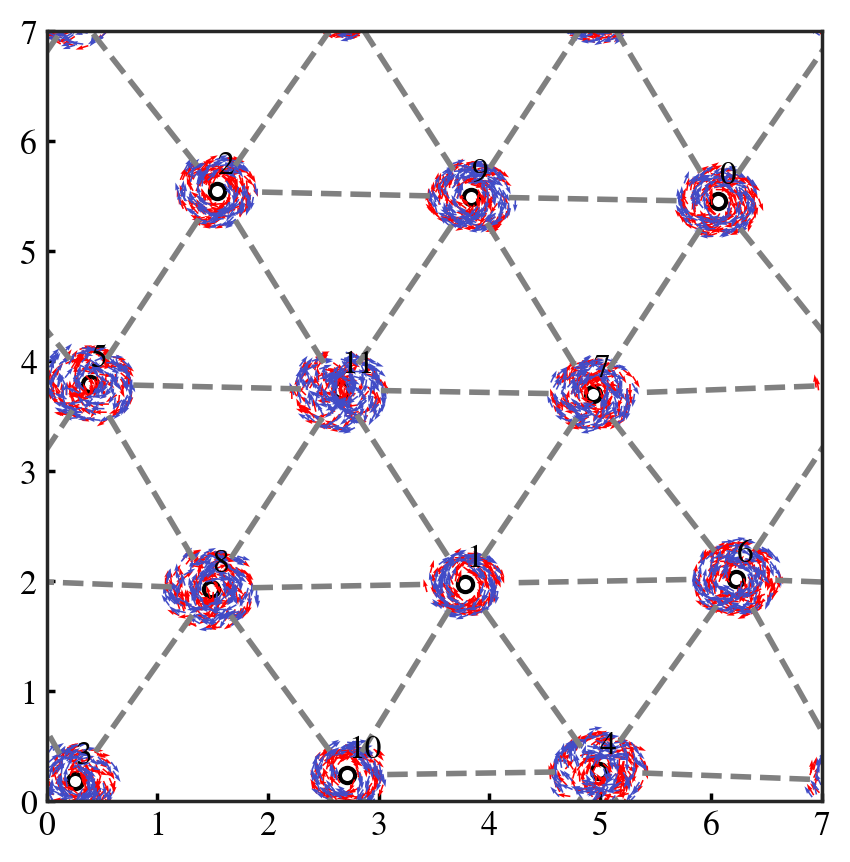

In [14]:
fig, ax = plt.subplots(figsize=(5, 5))

plt.scatter(
    classCenters[:, 0], classCenters[:, 1],
    facecolor="white", s=30, edgecolor="black", lw=1.5
)

for edge in edges[:]:
    # plt.plot(ajdClassCenters[edge, 0], ajdClassCenters[edge, 1],
    #          color="black", lw=1.2, alpha=0.3, linestyle=(0, (10, 2)), zorder=0)
    edgeCenter = (ajdClassCenters[edge[0]] + ajdClassCenters[edge[1]]) / 2
    edgeNodesDelta = ajdClassCenters[edge[0]] - ajdClassCenters[edge[1]]
    edgeAngle = np.arctan2(edgeNodesDelta[1], edgeNodesDelta[0])
    edgeShift = np.array([np.cos(edgeAngle), np.sin(edgeAngle)]) * 0.5 * model.distanceD0

    plt.plot([edgeCenter[0] - edgeShift[0], edgeCenter[0] + edgeShift[0]], 
             [edgeCenter[1] - edgeShift[1], edgeCenter[1] + edgeShift[1]],
             lw=2, alpha=1, color="gray", ls="--")

sa.plot_spatial(ax=ax, colorsBy="freq", index=-1, shift=shift)

for i, classCenter in enumerate(classCenters):
    plt.text(
        classCenter[0] + 0.01, classCenter[1] + 0.1, 
        f"{i}", ha="left", va="bottom", fontsize=12, color="black"
    )

plt.tick_params(length=3, direction="in")


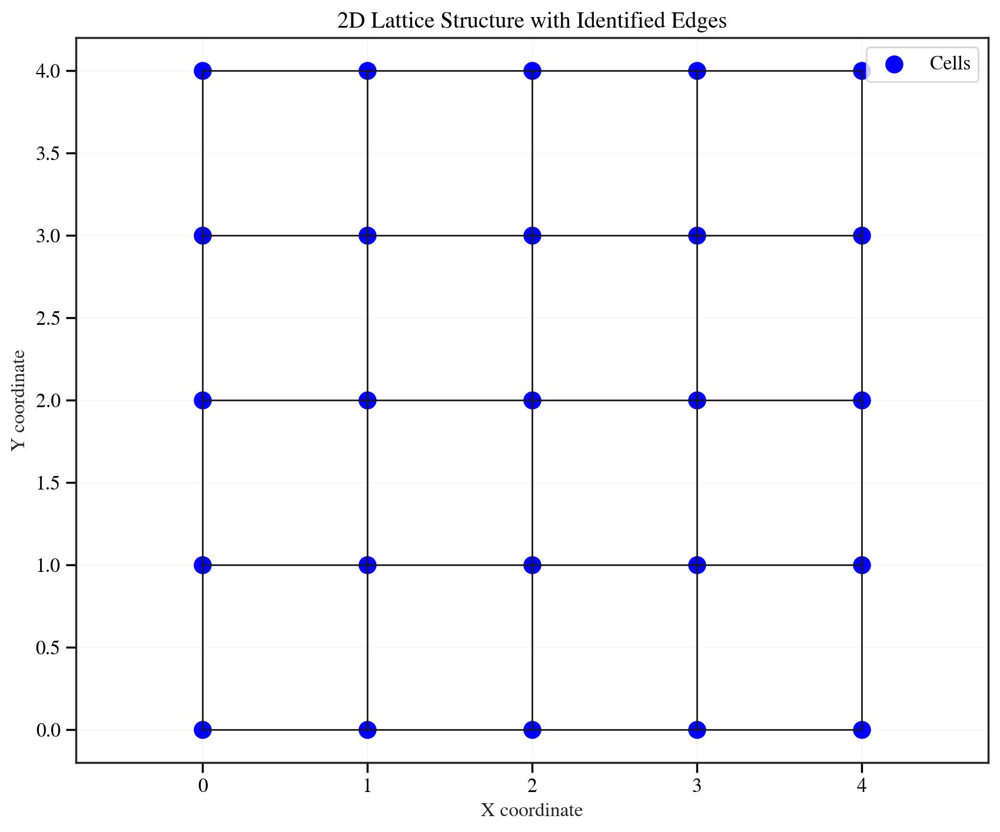

识别出的edges数量: 40
前10个edges: [(11, 16), (10, 11), (22, 23), (8, 13), (5, 6), (15, 20), (7, 12), (10, 15), (15, 16), (8, 9)]


In [36]:
import numpy as np
from scipy.spatial import Delaunay
import matplotlib.pyplot as plt

def identify_lattice_edges(cell_coords):
    """
    自适应识别二维晶格结构中cell之间的edges
    
    参数:
        cell_coords: numpy数组，形状为(N,2)，表示N个cell的二维坐标
        
    返回:
        edges: 列表，包含所有识别出的edges，每个edge表示为两个cell索引的元组
    """
    # 1. 使用Delaunay三角剖分获取初始连接
    tri = Delaunay(cell_coords)
    edges = set()
    
    # 从Delaunay三角剖分中提取edges
    for simplex in tri.simplices:
        for i in range(3):
            edge = tuple(sorted((simplex[i], simplex[(i+1)%3])))
            edges.add(edge)
    
    # 2. 计算所有edges的长度
    edge_lengths = []
    for edge in edges:
        p1 = cell_coords[edge[0]]
        p2 = cell_coords[edge[1]]
        length = np.linalg.norm(p1 - p2)
        edge_lengths.append(length)
    
    # 计算平均edge长度和标准差
    mean_length = np.mean(edge_lengths)
    std_length = np.std(edge_lengths)
    
    # 3. 过滤edges，保留合理的连接
    filtered_edges = []
    for edge in edges:
        p1 = cell_coords[edge[0]]
        p2 = cell_coords[edge[1]]
        length = np.linalg.norm(p1 - p2)
        
        # 保留长度在合理范围内的edges
        if length <= mean_length + 1.5 * std_length:
            filtered_edges.append(edge)
    
    return filtered_edges

def plot_lattice(cell_coords, edges):
    """
    绘制晶格结构和edges
    
    参数:
        cell_coords: numpy数组，形状为(N,2)，表示N个cell的二维坐标
        edges: edges列表，每个edge表示为两个cell索引的元组
    """
    plt.figure(figsize=(10, 8))
    
    # 绘制cells
    plt.scatter(cell_coords[:, 0], cell_coords[:, 1], c='blue', s=100, label='Cells')
    
    # 绘制edges
    for edge in edges:
        p1 = cell_coords[edge[0]]
        p2 = cell_coords[edge[1]]
        plt.plot([p1[0], p2[0]], [p1[1], p2[1]], 'k-', linewidth=1)
    
    # 添加标签和标题
    plt.title('2D Lattice Structure with Identified Edges', fontsize=14)
    plt.xlabel('X coordinate', fontsize=12)
    plt.ylabel('Y coordinate', fontsize=12)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.axis('equal')
    plt.show()

# 示例使用
if __name__ == "__main__":
    # 创建一个简单的方形晶格
    x, y = np.meshgrid(np.arange(5), np.arange(5))
    cell_coords = np.column_stack((x.ravel(), y.ravel()))
    
    # 添加一些随机扰动，使晶格不完全规则
    # cell_coords += np.random.normal(0, 0.1, cell_coords.shape)
    
    # 识别edges
    edges = identify_lattice_edges(cell_coords)
    
    # 绘制结果
    plot_lattice(cell_coords, edges)
    
    print(f"识别出的edges数量: {len(edges)}")
    print("前10个edges:", edges[:10])

In [37]:
edges

[(11, 16),
 (10, 11),
 (22, 23),
 (8, 13),
 (5, 6),
 (15, 20),
 (7, 12),
 (10, 15),
 (15, 16),
 (8, 9),
 (1, 6),
 (16, 21),
 (18, 19),
 (1, 2),
 (18, 23),
 (16, 17),
 (4, 9),
 (6, 7),
 (20, 21),
 (12, 13),
 (12, 17),
 (9, 14),
 (6, 11),
 (14, 19),
 (19, 24),
 (0, 5),
 (2, 3),
 (17, 22),
 (11, 12),
 (23, 24),
 (0, 1),
 (2, 7),
 (7, 8),
 (5, 10),
 (17, 18),
 (21, 22),
 (13, 14),
 (3, 8),
 (13, 18),
 (3, 4)]

array([[0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4]])